# **Telecom customer Retention**

# Context:

In the highly competitive telecommunications industry, customer retention is just as critical as customer acquisition. The cost of acquiring a new customer is often significantly higher than the cost of retaining an existing one. This dataset represents the customer base of a fictional telecom provider that is seeking to reduce its "churn rate",the percentage of customers who stop using their services. By analyzing demographic data, service subscriptions, and billing information, the company aims to uncover the underlying patterns that lead to customer departures.

# Objective

The primary objective of this analysis is to develop a data-driven understanding of customer churn. Specifically, the project aims to:

- Identify Risk Factors: Determine which customer attributes (e.g., contract type, internet service, or tenure) are the strongest predictors of churn.

- Predictive Modeling: Build a model to accurately identify high-risk customers before they leave, allowing for proactive intervention.

- Business Insights: Provide actionable recommendations for the marketing and customer success teams, such as identifying which service bundles or payment methods improve customer loyalty.

# Data Descriptions

- customerID: A unique identifier for each customer.

- gender: Whether the customer is male or female.

- SeniorCitizen: Whether the customer is a senior citizen.

- Partner: Whether the customer has a partner.
- Dependents: Whether the customer has dependents.

- tenure: Number of months the customer has stayed with the company.

- PhoneService: Whether the customer has a phone service.

- MultipleLines: Whether the customer has multiple lines.

- InternetService: Customer’s internet service provider.

- OnlineSecurity: Whether the customer has online security.

- OnlineBackup: Whether the customer has online backup.

- DeviceProtection: Whether the customer has device protection.

- TechSupport: Whether the customer has tech support.

- StreamingTV: Whether the customer has streaming TV.

- StreamingMovies: Whether movie streaming service is included.

- Contract: Contract duration.

- PaperlessBilling: Whether the customer uses paperless billing.

- PaymentMethod: How the customer pays.

- MonthlyCharges: Amount charged to the customer per month.

- TotalCharges: Total amount charged to the customer over their tenure.

- Churn: Indicates whether the customer left the company.

#Importing Neccesary Libraries

In [ ]:
# To help with reading and manipulating data
import pandas as pd
import numpy as np

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

# To help with model building
from sklearn.linear_model import LogisticRegression,RidgeClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)
#Libraries for oversampling and undersampling imbalance target data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import make_pipeline
from imblearn.pipeline import Pipeline



#Libraries to help with regularization models
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them

from sklearn.compose import ColumnTransformer
from imblearn.pipeline import make_pipeline
from sklearn.preprocessing import FunctionTransformer

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")


from sklearn.compose import ColumnTransformer

import scipy.stats as stats

#Loading data set

In [ ]:
df_main = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn 2.csv") #Loading dataset
# copying data to another variable to avoid any changes to original data
data = df_main.copy()

# *Data Overview*

- Obervations
- Sanity check

In [ ]:
data.head(7)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85000,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95000,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85000,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30000,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70000,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65000,820.5,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10000,1949.4,No


In [ ]:
data.shape

(7043, 21)

- There are 21 columns and 7043 in the data set

In [ ]:
# Checking Unique values of each column

unique_values = {
    column: set(data[column].unique())
    for column in data.columns
    if column != "customerID" and not np.issubdtype(data[column].dtype, np.floating)
}

for feature, values in unique_values.items():
    print(f"Unique values for {feature}: {values}")



Unique values for gender: {'Male', 'Female'}
Unique values for SeniorCitizen: {np.int64(0), np.int64(1)}
Unique values for Partner: {'No', 'Yes'}
Unique values for Dependents: {'No', 'Yes'}
Unique values for tenure: {np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(51), np.int64(52), np.int64(53), np.int64(54), np.int64(55), np.int64(

In [ ]:
data['Churn'].value_counts()

,count
Churn,
No,5174
Yes,1869


- The predictor variable is markedly imbalanced, this will affect which model and metric I will be using later in the notebook.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


- TotalCharge column is stored as an Object instead of a float though there are no null values in the column, this may indicate some missing values in this column.

In [ ]:
missing_total_charges = data["TotalCharges"].isnull().sum()
print(f"There are {missing_total_charges} missing values in the TotalCharges column")


There are 0 missing values in the TotalCharges column


- There are no missing or Nan values its likely there are some blank cells in the totalCharge column that is causing the feature to be stored as an object.

In [ ]:
missing_total_charges = (
    data["TotalCharges"].isnull().sum()
    + (data["TotalCharges"].str.strip() == "").sum()
)

print(f"There are {missing_total_charges} missing or blank values in the TotalCharges column")


There are 11 missing or blank values in the TotalCharges column


- Confirmed, blank values are the culprit.
- These customers are likely to be new customers who 0 tenure period and thus have met the threshold(probably spending at least 2 months) to have a total charge.

In [ ]:
#Checking for missing values
missing_values = data.isnull().sum()
print(f'There are {missing_values.sum()} missing values')

There are 0 missing values


In [ ]:
missing_df = pd.DataFrame({
    "Column": data.columns,
    "Missing_or_Blank_Count": [
        data[col].isnull().sum() + (data[col].str.strip() == "").sum()
        if data[col].dtype == "object"
        else data[col].isnull().sum()
        for col in data.columns
    ]
})

missing_df

,Column,Missing_or_Blank_Count
0,customerID,0
1,gender,0
2,SeniorCitizen,0
3,Partner,0
4,Dependents,0
5,tenure,0
6,PhoneService,0
7,MultipleLines,0
8,InternetService,0
9,OnlineSecurity,0


In [ ]:
#Checking for duplicates
duplicates = data.duplicated().sum()
print(f'There are {duplicates} duplicates')

There are 0 duplicates


##*Statistical Summary*

In [ ]:
#Checking statistical summary
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
customerID,7043,7043,3186-AJIEK,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,7043,2,Male,3555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SeniorCitizen,7043.00000,NaN,NaN,NaN,0.16215,0.36861,0.00000,0.00000,0.00000,0.00000,1.00000
Partner,7043,2,No,3641,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependents,7043,2,No,4933,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tenure,7043.00000,NaN,NaN,NaN,32.37115,24.55948,0.00000,9.00000,29.00000,55.00000,72.00000
PhoneService,7043,2,Yes,6361,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MultipleLines,7043,3,No,3390,NaN,NaN,NaN,NaN,NaN,NaN,NaN
InternetService,7043,3,Fiber optic,3096,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OnlineSecurity,7043,3,No,3498,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- TotalCharge statistical summary is still poorly represented because of its issues with data type highlighted earlier.

#Exploratory data analysis

In [ ]:
#Creating a copy of dataset for EDA
data1 = data.copy()
#dropping unique identifier column 'customerID'
data1 = data1.drop('customerID', axis=1)

In [ ]:
data1.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

##Creating user defined function to carryout EDA.

In [ ]:
def histogram_boxplot(data, feature, figsize=(15, 10), kde=False, bins=None):
    """
    Boxplot and histogram combined
    """

    # Force numeric safety
    series = pd.to_numeric(data[feature], errors="coerce")

    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,
        sharex=True,
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )

    sns.boxplot(
        x=series,
        ax=ax_box2,
        showmeans=True,
        color="violet"
    )

    # Histogram (bins only passed if provided)
    if bins is not None:
        sns.histplot(series, kde=kde, ax=ax_hist2, bins=bins)
    else:
        sns.histplot(series, kde=kde, ax=ax_hist2)

    ax_hist2.axvline(series.mean(), color="green", linestyle="--")
    ax_hist2.axvline(series.median(), color="black", linestyle="-")



In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=True, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data1[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data1,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [ ]:
#Defining function to plot stacked barplot
def stacked_barplot(data, x, y, normalize=False):
    """
    Stacked bar plot for two categorical variables
    """

    # Defensive check
    if x not in data.columns or y not in data.columns:
        raise KeyError(f"{x} or {y} not found in dataframe")

    ct = pd.crosstab(data[x], data[y], normalize="index" if normalize else False)

    ct.plot(
        kind="bar",
        stacked=True,
        figsize=(8, 5)
    )

    plt.xlabel(x)
    plt.ylabel("Proportion" if normalize else "Count")
    plt.title(f"{x} vs {y}")
    plt.legend(title=y)


In [ ]:
# function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data1[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data1[data1[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data1[data1[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data1, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

##Univariate Analysis

<Figure size 640x480 with 0 Axes>

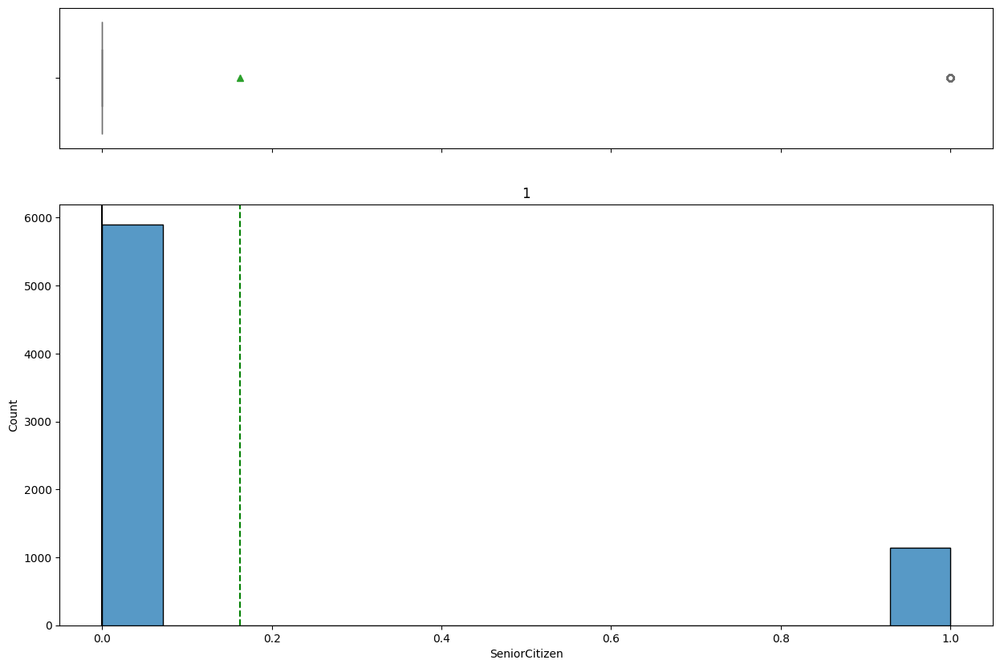

<Figure size 640x480 with 0 Axes>

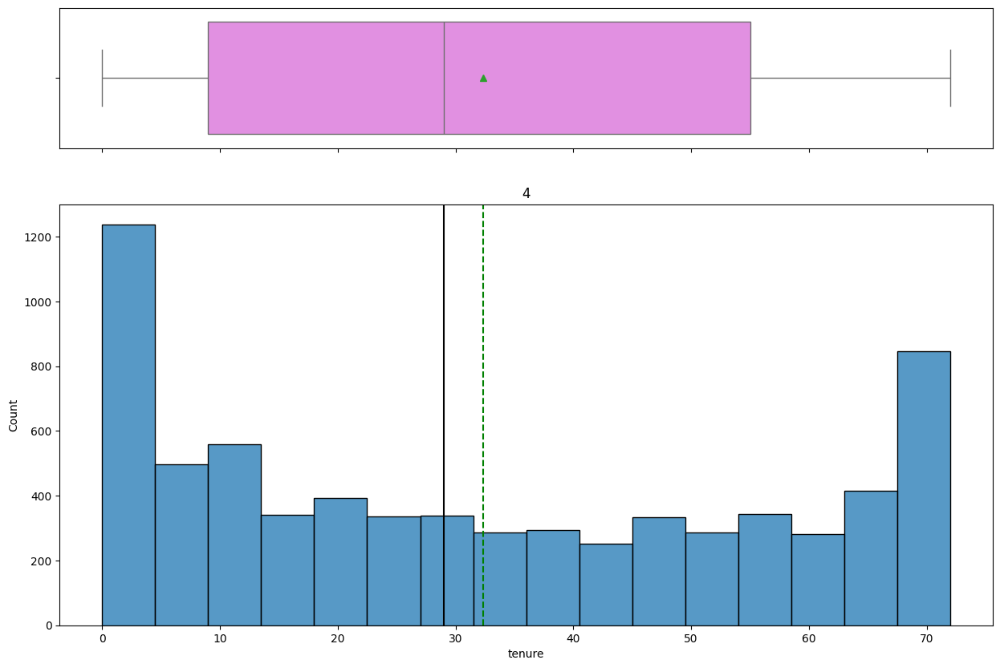

<Figure size 640x480 with 0 Axes>

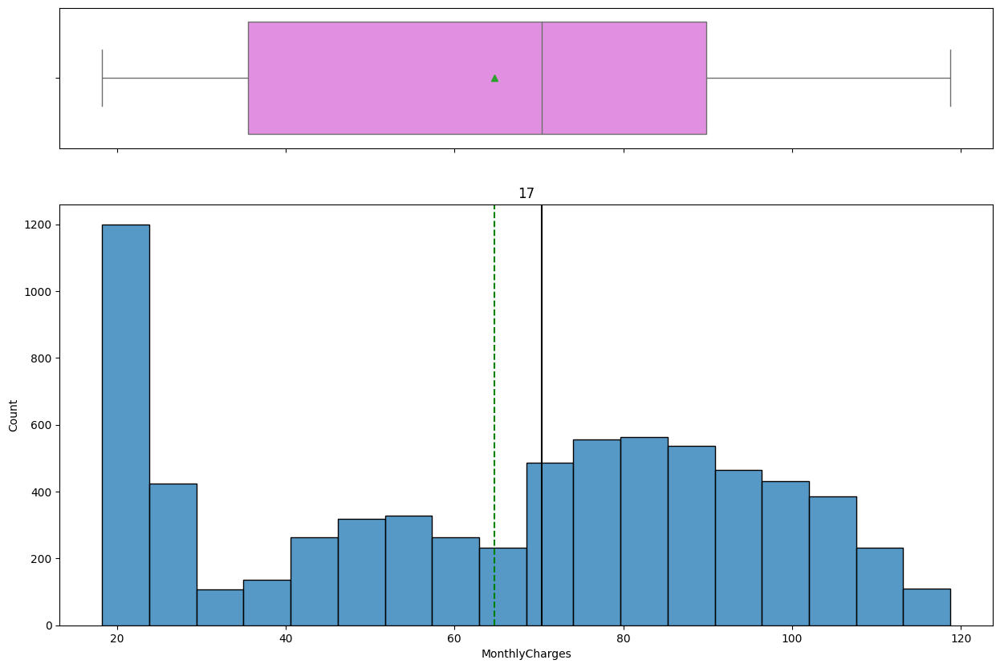

In [ ]:
# Check for continuous data types
continuous_cols = data.select_dtypes(include=[np.number])  # Select numeric columns

# Loop through continuous columns
for col in continuous_cols.columns:
    plt.figure()  # Create a new figure for each plot
    histogram_boxplot(data1, col)  # Pass the column name (feature)

    # Extract the column title from the DataFrame
    col_title = data1.columns.get_loc(col)  # Get the column index and use it to retrieve the title
    plt.title(col_title)  # Set the plot title using the column title
    plt.show()

- The largest number of customers(1200) pay the least montly charge(20).
- The largest number of customers(about 1200) spent less than a month with the company.

###Visalizing features with categorical variables

<Figure size 640x480 with 0 Axes>

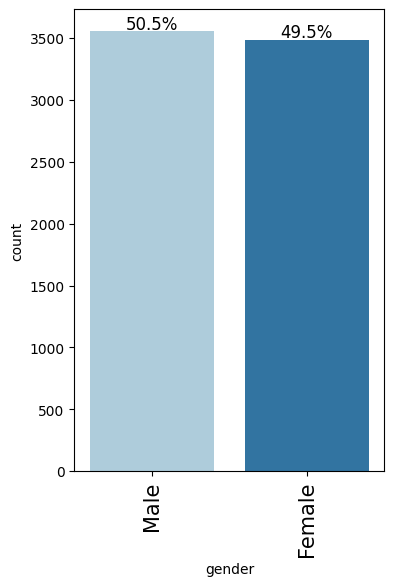

<Figure size 640x480 with 0 Axes>

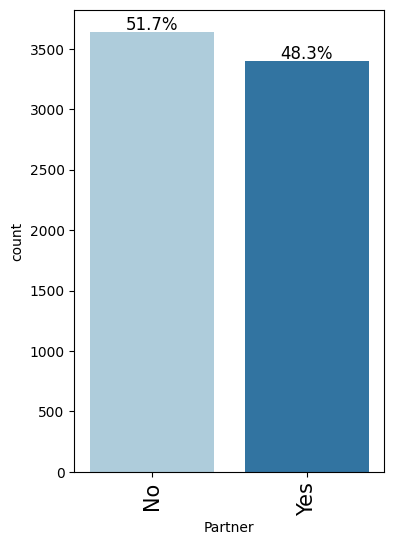

<Figure size 640x480 with 0 Axes>

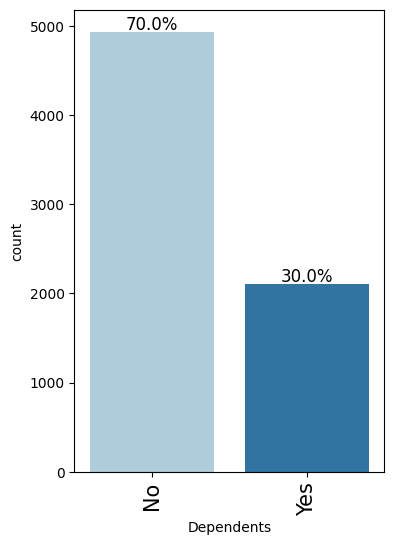

<Figure size 640x480 with 0 Axes>

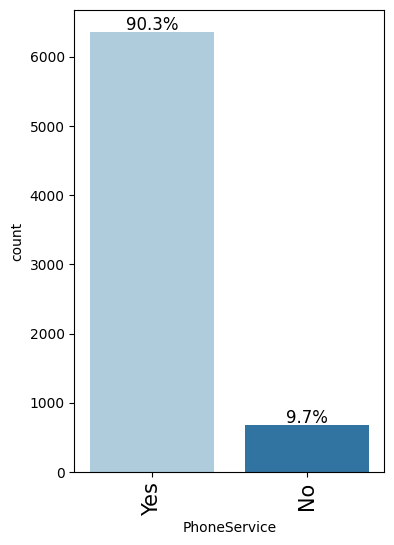

<Figure size 640x480 with 0 Axes>

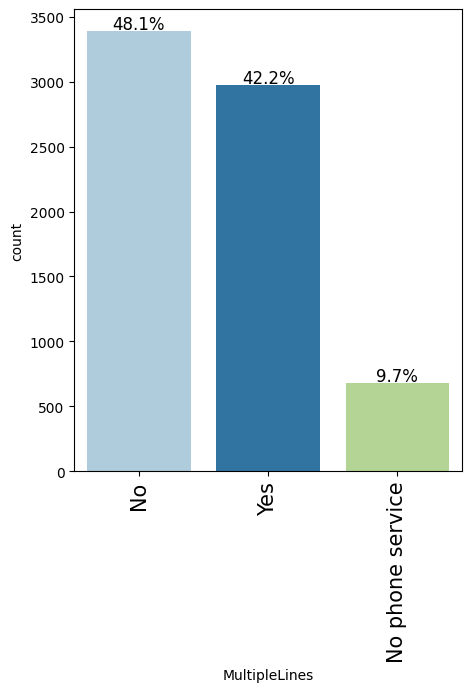

<Figure size 640x480 with 0 Axes>

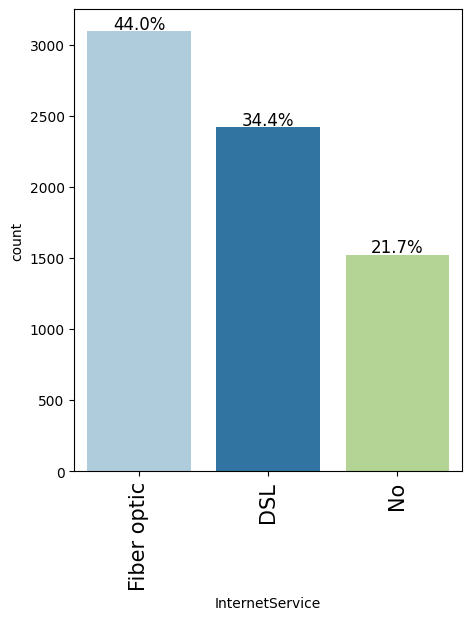

<Figure size 640x480 with 0 Axes>

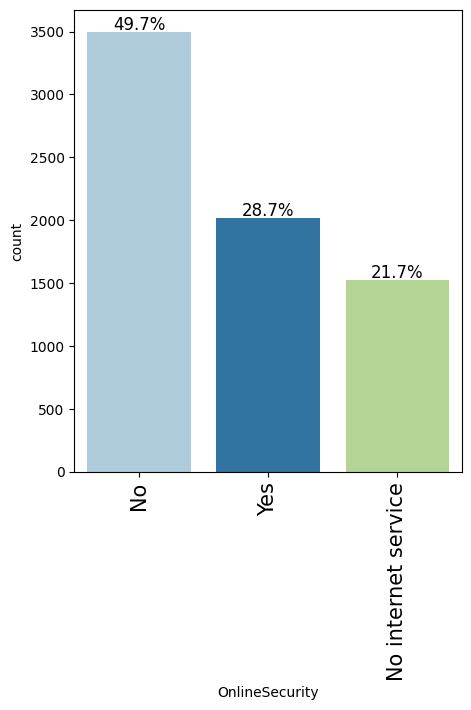

<Figure size 640x480 with 0 Axes>

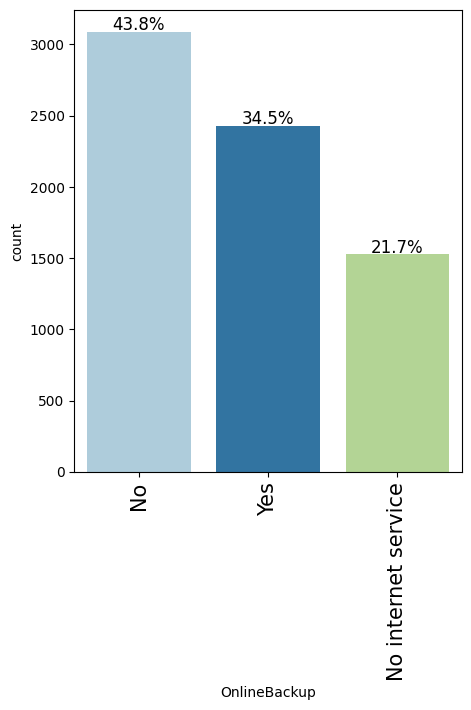

<Figure size 640x480 with 0 Axes>

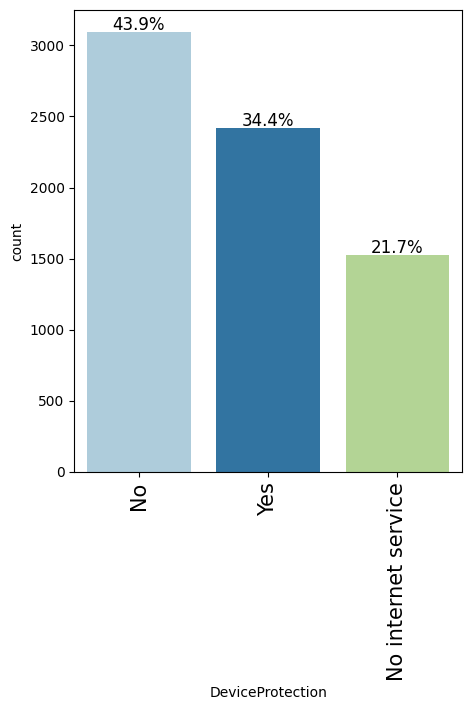

<Figure size 640x480 with 0 Axes>

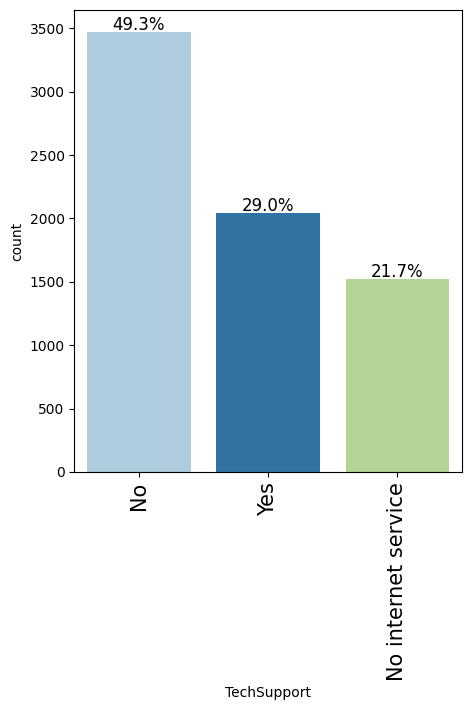

<Figure size 640x480 with 0 Axes>

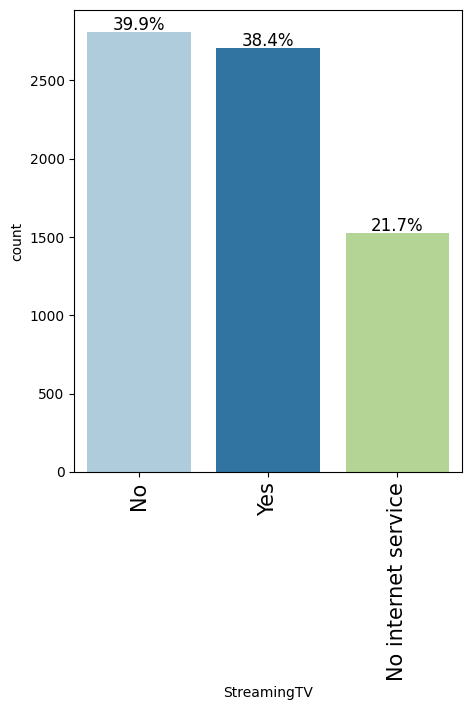

<Figure size 640x480 with 0 Axes>

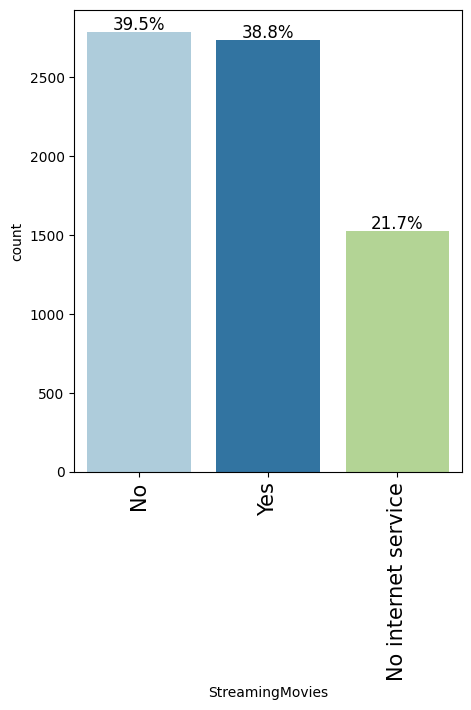

<Figure size 640x480 with 0 Axes>

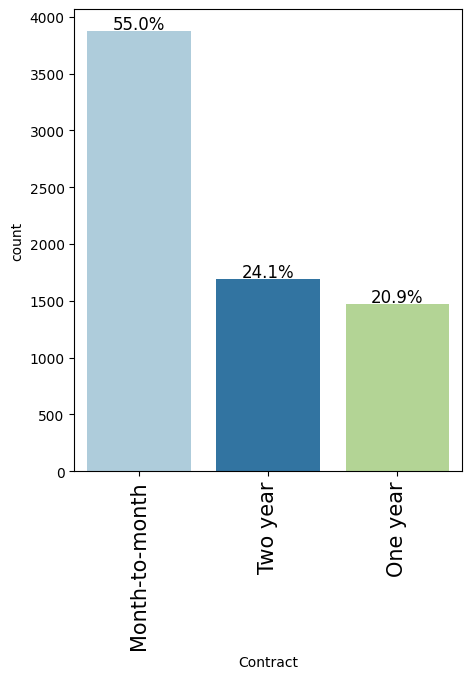

<Figure size 640x480 with 0 Axes>

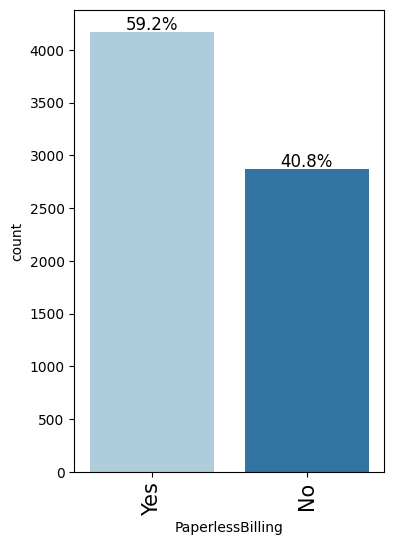

<Figure size 640x480 with 0 Axes>

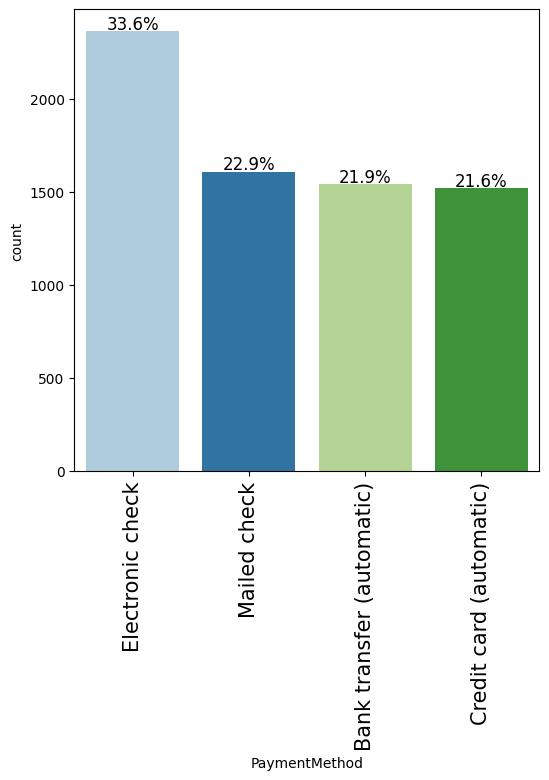

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

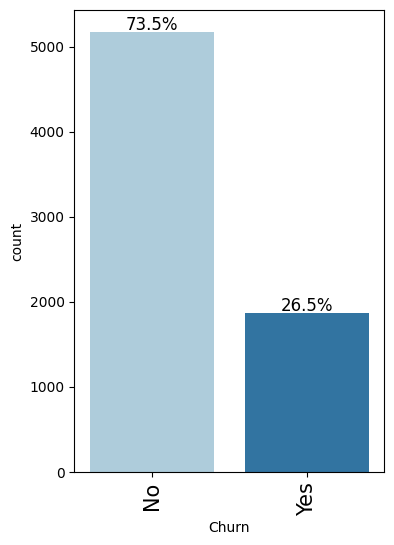

In [ ]:
# Check for categorical data types
categorical_cols = data1.select_dtypes(include=['object'])  # Select category columns (categorical data)


# Loop through categorical columns
for col in categorical_cols.columns:
   plt.figure()  # Create a new figure for each plot

   labeled_barplot(data, col)  # Plot bar chart of categorical variables

   plt.show();

##Bivariate analysis

In [ ]:
data2 = data1.copy()

In [ ]:
# Converting Boolean variables to binary coding
data2['Churn'] = data2['Churn'].replace({'Yes': 1, 'No': 0})
data2['Partner'] = data2['Partner'].replace({'Yes': 1, 'No': 0})
data2['Dependents'] = data2['Dependents'].replace({'Yes': 1, 'No': 0})
data2['PhoneService'] = data2['PhoneService'].replace({'Yes': 1, 'No': 0})
data2['PaperlessBilling'] = data2['PaperlessBilling'].replace({'Yes': 1, 'No': 0})

In [ ]:
# One-hot encoding non-ordinal features
def create_dummies(data2, specific_cols):
    """
    Creates dummy variables for specific columns in a pandas DataFrame.

    Args:
        data: The pandas DataFrame.
        specific_cols (list): A list of column names to convert to dummy variables.

    Returns:
        pandas.DataFrame: The DataFrame with new dummy variables.
    """

    # Create dummy variables for the specified columns
    dummies = pd.get_dummies(data2[specific_cols], drop_first=False)

    # Drop the original columns from the DataFrame
    data2 = data2.drop(columns=specific_cols)

    # Combine original data without the specified columns with dummy variables
    return pd.concat([data2, dummies], axis=1)


specific_cols = ['MultipleLines', 'InternetService', 'OnlineSecurity','OnlineBackup','DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaymentMethod']  # Columns to convert to dummies
data2 = create_dummies(data2, specific_cols)  # Saving dummy variables

In [ ]:
data2 = data2.replace({"Yes": 1, "No": 0})


In [ ]:
data2.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,Female,0,1,0,1,0,1,29.850,29.85,0,False,True,False,True,False,False,True,False,False,False,False,True,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False
1,Male,0,0,0,34,1,0,56.950,1889.5,0,True,False,False,True,False,False,False,False,True,True,False,False,False,False,True,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,True
2,Male,0,0,0,2,1,1,53.850,108.15,1,True,False,False,True,False,False,False,False,True,False,False,True,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,True
3,Male,0,0,0,45,0,0,42.300,1840.75,0,False,True,False,True,False,False,False,False,True,True,False,False,False,False,True,False,False,True,True,False,False,True,False,False,False,True,False,True,False,False,False
4,Female,0,0,0,2,1,1,70.700,151.65,1,True,False,False,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False


###Corelation Heatmap

In [ ]:
# creating a list of numerical columns
num_cols = data2.select_dtypes(include=[np.number, bool]).columns.tolist()


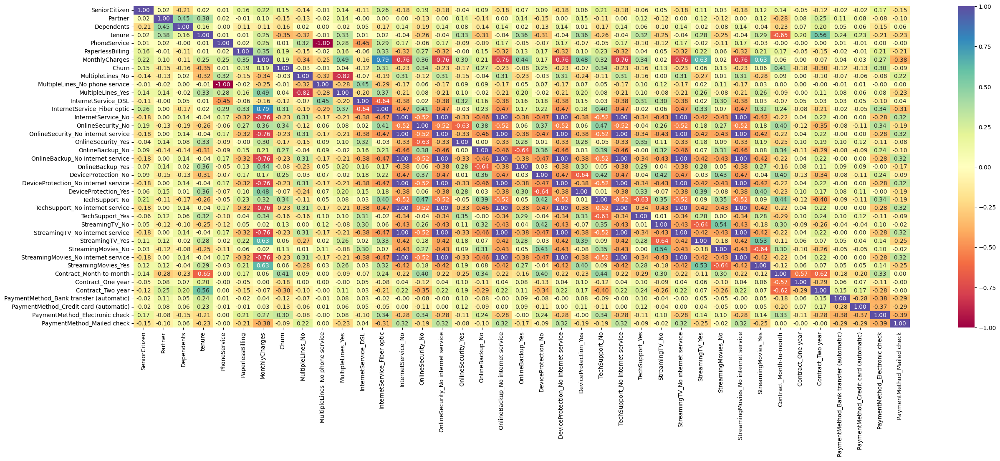

In [ ]:
#plotting correlation heat map
plt.figure(figsize=(30, 10))
sns.heatmap(
    data2[num_cols].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")

plt.show()

###Bivariate analysis

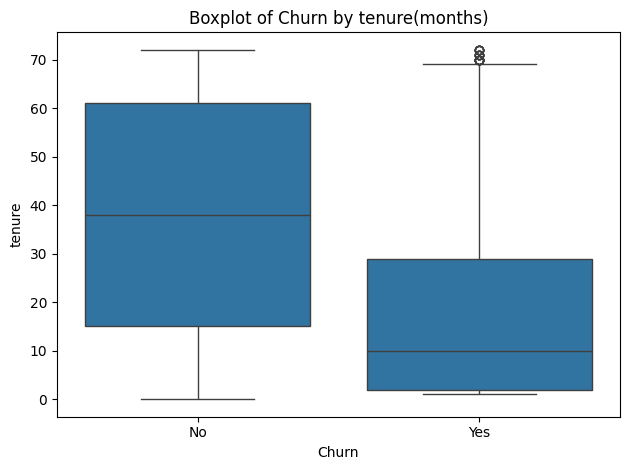

In [ ]:
plt.figure()
sns.boxplot(data = data1,x = 'Churn' , y = 'tenure')
plt.title('Boxplot of Churn by tenure(months)')
plt.tight_layout()
plt.show();

- 10-18 months appears to be a very critical period. Customers who spend at least 10-18 months with the company are least likely to Churn.

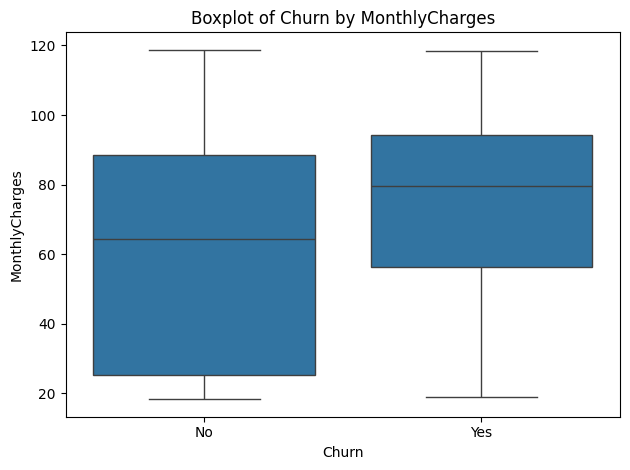

In [ ]:
plt.figure()
sns.boxplot(data = data1,x = 'Churn' , y = 'MonthlyCharges')
plt.title('Boxplot of Churn by MonthlyCharges')
plt.tight_layout()
plt.show();

- Customers who pay at least 80 dollars monthly are most likely to churn.

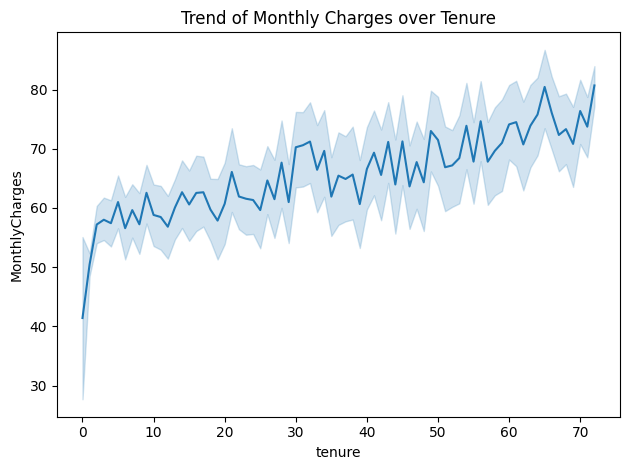

In [ ]:

sns.lineplot(data=data1, x='tenure', y='MonthlyCharges')

plt.title('Trend of Monthly Charges over Tenure')
plt.tight_layout()

# Save the output
plt.savefig('tenure_monthly_charges_line.png')

- It appears the longer the customers remain with company, the more likely they to subscribe to more services and incur more montly charge.
- Infact it appear loyal customers are willing to spend more.

<Figure size 640x480 with 0 Axes>

InternetService   DSL  Fiber optic    No   All
Churn                                         
All              2421         3096  1526  7043
No               1962         1799  1413  5174
Yes               459         1297   113  1869
------------------------------------------------------------------------------------------------------------------------


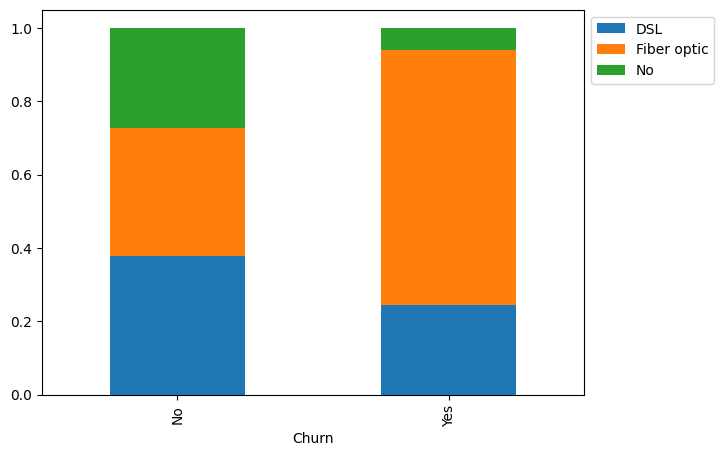

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Churn', 'InternetService')
plt.show();

- It shows customers with Fiber optic internet service are likelier to churn.

<Figure size 640x480 with 0 Axes>

DeviceProtection    No  No internet service   Yes   All
Churn                                                  
All               3095                 1526  2422  7043
No                1884                 1413  1877  5174
Yes               1211                  113   545  1869
------------------------------------------------------------------------------------------------------------------------


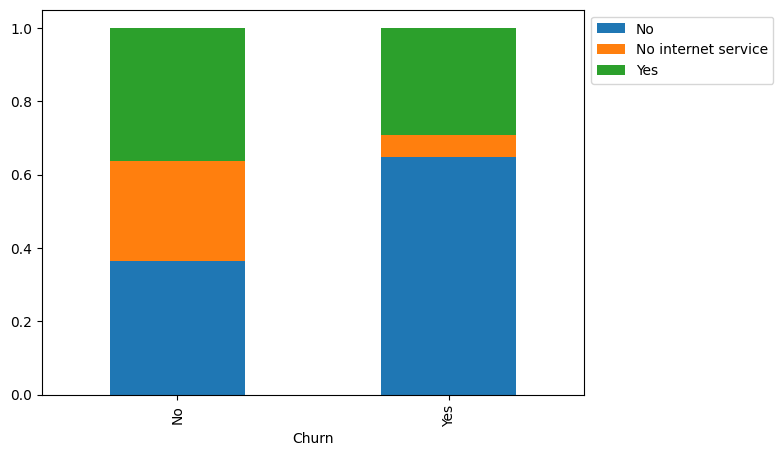

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Churn', 'DeviceProtection')
plt.show();

- Customers who do not subscribe to device protection service are more likely to churn.

Churn             No   Yes   All
Contract                        
All             5174  1869  7043
Month-to-month  2220  1655  3875
One year        1307   166  1473
Two year        1647    48  1695
------------------------------------------------------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

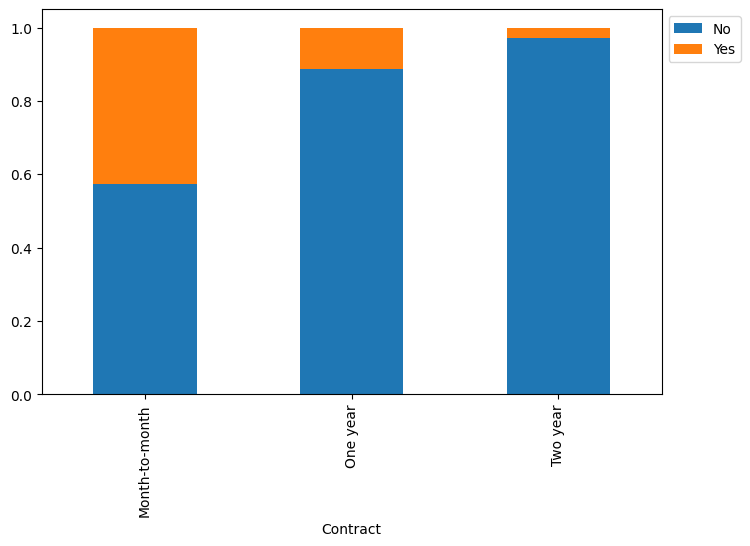

In [ ]:
plt.figure()
stacked_barplot(data,'Contract', 'Churn')
plt.show();

- Customers who subscribe to month-to-month contracts are most likely to churn.

Partner           No   Yes   All
Contract                        
All             3641  3402  7043
Month-to-month  2495  1380  3875
Two year         503  1192  1695
One year         643   830  1473
------------------------------------------------------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

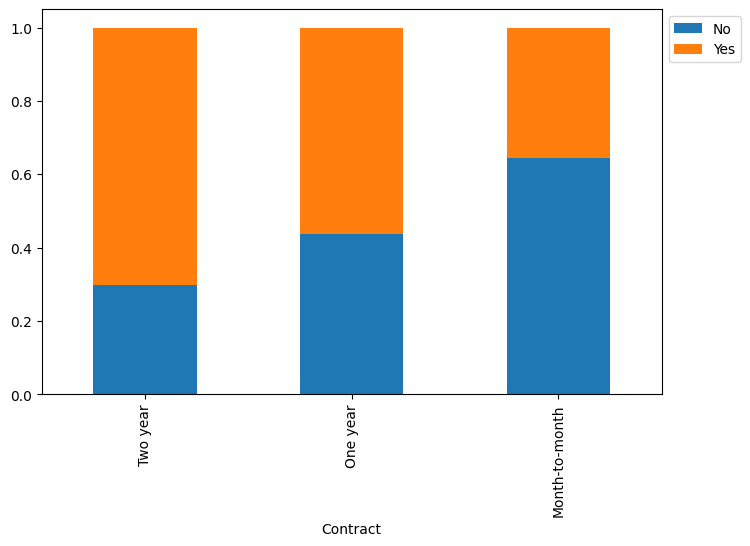

In [ ]:
plt.figure()
stacked_barplot(data,'Contract', 'Partner')
plt.show();

- Customers with no partners are most likely to subscribe to the month-to-month contract plans.

<Figure size 640x480 with 0 Axes>

Dependents        No   Yes   All
Contract                        
All             4933  2110  7043
Two year         905   790  1695
Month-to-month  3086   789  3875
One year         942   531  1473
------------------------------------------------------------------------------------------------------------------------


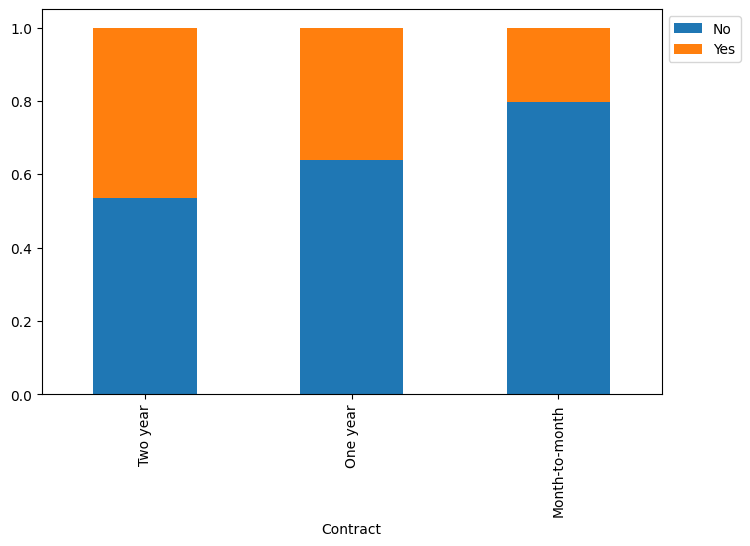

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'Dependents')

plt.show();

Customers with no dependents are most likely to subscribe to the month-to-month contract plans.

<Figure size 640x480 with 0 Axes>

OnlineSecurity    No  No internet service   Yes   All
Contract                                             
All             3498                 1526  2019  7043
Two year         310                  638   747  1695
Month-to-month  2631                  524   720  3875
One year         557                  364   552  1473
------------------------------------------------------------------------------------------------------------------------


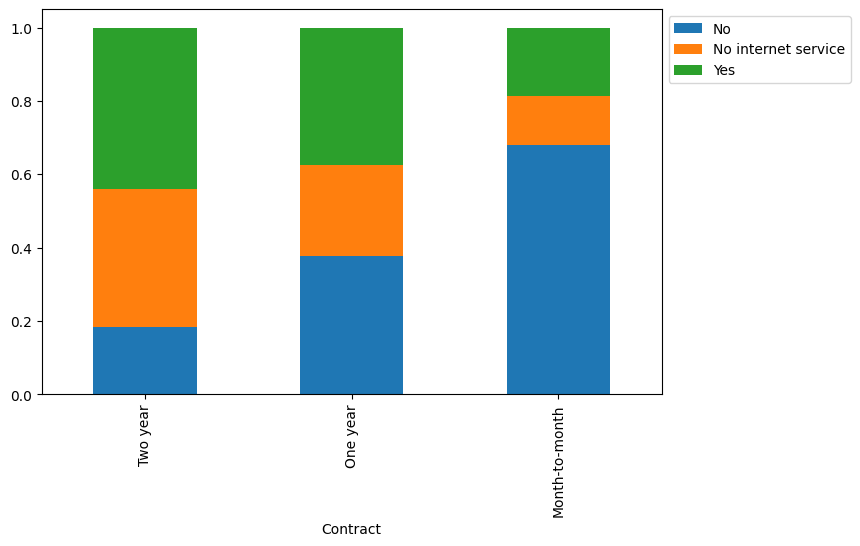

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'OnlineSecurity')

plt.show();

- Customers who do not subcribe to online security service are most likely to subscribe to the month-to-month contract plans.

<Figure size 640x480 with 0 Axes>

OnlineBackup      No  No internet service   Yes   All
Contract                                             
All             3088                 1526  2429  7043
Two year         313                  638   744  1695
Month-to-month  2288                  524  1063  3875
One year         487                  364   622  1473
------------------------------------------------------------------------------------------------------------------------


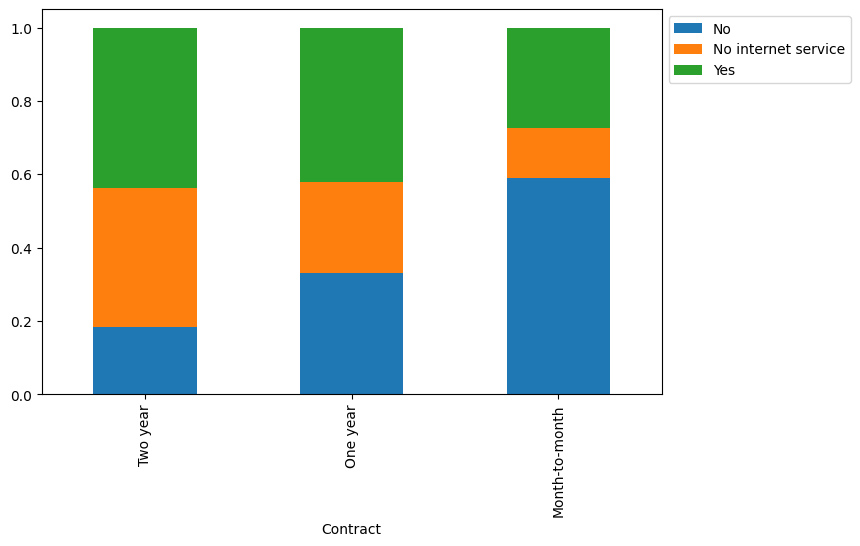

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'OnlineBackup')
plt.show();

- Customers who do not subcribe to online backup service are most likely to subscribe to the month-to-month contract plans.

<Figure size 640x480 with 0 Axes>

TechSupport       No  No internet service   Yes   All
Contract                                             
All             3473                 1526  2044  7043
Two year         236                  638   821  1695
Month-to-month  2680                  524   671  3875
One year         557                  364   552  1473
------------------------------------------------------------------------------------------------------------------------


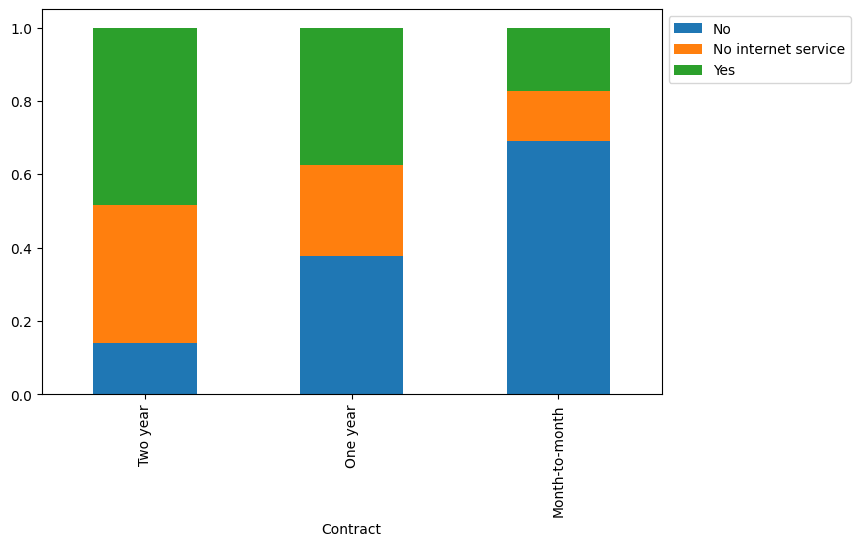

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'TechSupport')
plt.show();

- Customers who do not use tech support service are most likely to subscribe to the month-to-month contract plans.

<Figure size 640x480 with 0 Axes>

StreamingMovies    No  No internet service   Yes   All
Contract                                              
All              2785                 1526  2732  7043
Two year          291                  638   766  1695
Month-to-month   2047                  524  1304  3875
One year          447                  364   662  1473
------------------------------------------------------------------------------------------------------------------------


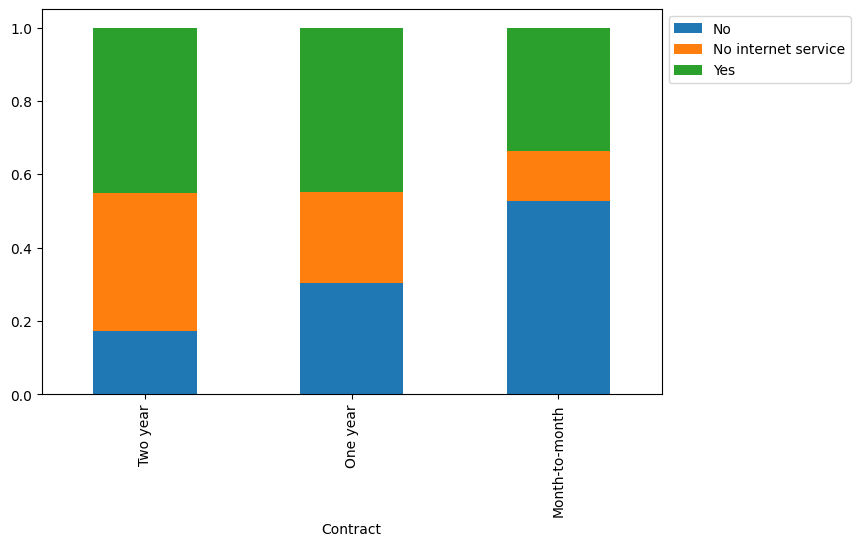

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'StreamingMovies')
plt.show();

- Customers who do not subcribe to streaming movies service are most likely to subscribe to the month-to-month contract plans.

<Figure size 640x480 with 0 Axes>

StreamingTV       No  No internet service   Yes   All
Contract                                             
All             2810                 1526  2707  7043
Two year         300                  638   757  1695
Month-to-month  2053                  524  1298  3875
One year         457                  364   652  1473
------------------------------------------------------------------------------------------------------------------------


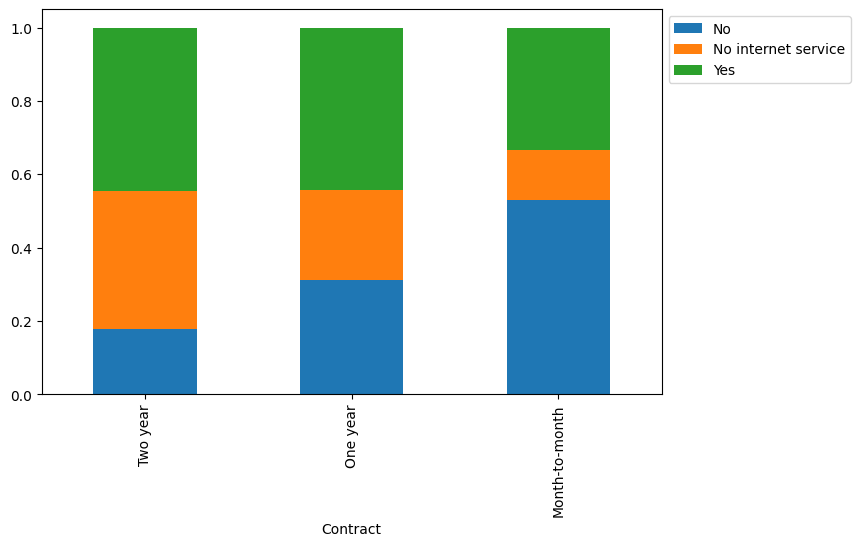

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'StreamingTV')
plt.show();

- Customers who do not subcribe to streaming tv services are most likely to subscribe to the month-to-month contract plans.

<Figure size 640x480 with 0 Axes>

PaymentMethod   Bank transfer (automatic)  Credit card (automatic)  \
Contract                                                             
All                                  1544                     1522   
Two year                              564                      581   
Month-to-month                        589                      543   
One year                              391                      398   

PaymentMethod   Electronic check  Mailed check   All  
Contract                                              
All                         2365          1612  7043  
Two year                     168           382  1695  
Month-to-month              1850           893  3875  
One year                     347           337  1473  
------------------------------------------------------------------------------------------------------------------------


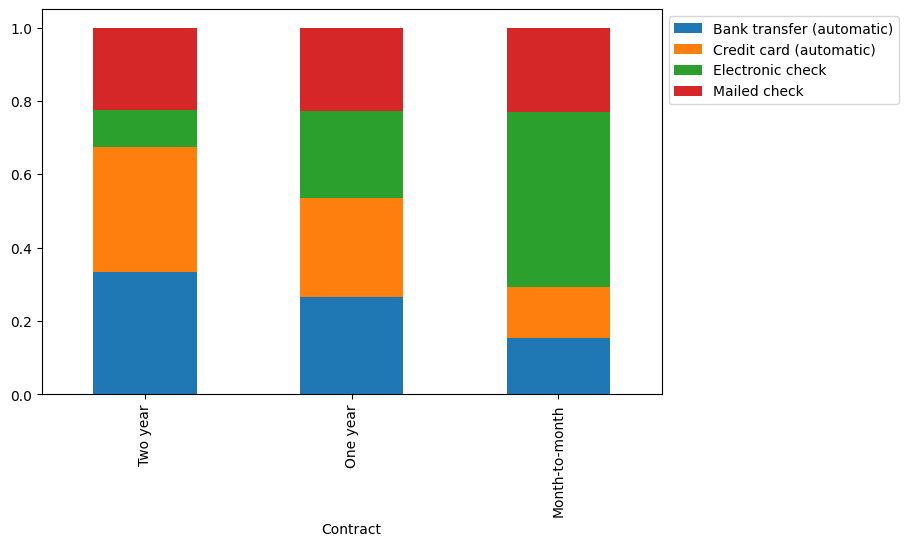

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'PaymentMethod')
plt.show();

- Customers whose payment method is electronic check are most likely to subscribe to the month-to-month contract plans.
- While those subscribed to two years contracts are most likely to use a bank transfer method.


<Figure size 640x480 with 0 Axes>

PhoneService     No   Yes   All
Contract                       
All             682  6361  7043
Month-to-month  376  3499  3875
Two year        161  1534  1695
One year        145  1328  1473
------------------------------------------------------------------------------------------------------------------------


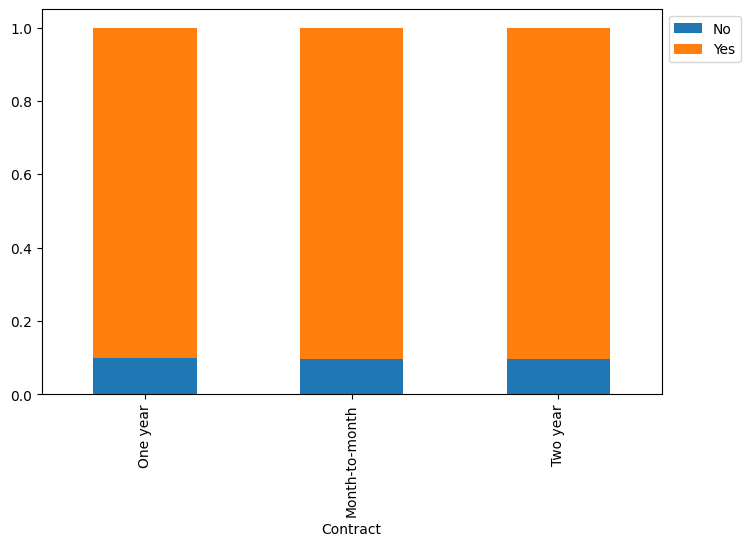

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'PhoneService')
plt.show();

- No notable findings.

<Figure size 640x480 with 0 Axes>

InternetService   DSL  Fiber optic    No   All
Contract                                      
All              2421         3096  1526  7043
Two year          628          429   638  1695
Month-to-month   1223         2128   524  3875
One year          570          539   364  1473
------------------------------------------------------------------------------------------------------------------------


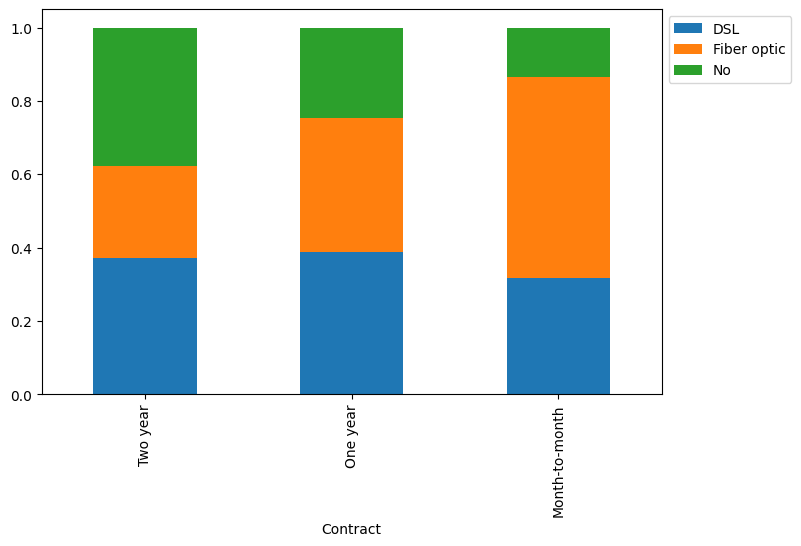

In [ ]:
plt.figure()
plt.show();
stacked_barplot(data,'Contract', 'InternetService')
plt.show();

- Customers with month to month contracts are most likely to use fiber optics internet service.

# Performing data cleaning and preparing for Modeling

###Data cleaning

- 11 blank data points where observed in 'TotalCharges' column of the dataset, this made the column to be saved as an object instead of a float.
- It was also observed that only customer with a tenure of 0(new customers) have blank TotalCharges, these are likely new customers and have not made any payments so far.
- Hence I will be applying 0 as TotalCharge to this group of customers.
- Unique Identifier column will also be dropped as its useless in modeling data, 'CustomerID'
- There are no other issues in the dataset that requires cleaning.

In [ ]:
#dropping unique identifier column 'customerID'
data = data.drop('customerID', axis=1)

In [ ]:
#Imputing zero to the 11 new customer with blank TotalCharge value
data.loc[data["tenure"] == 0, "TotalCharges"] = 0


Checking again for missing or blank values in TotalCharge column.

In [ ]:
missing_total_charges = (
    data["TotalCharges"].isnull().sum()
    + (data["TotalCharges"].str.strip() == "").sum()
)

print(f"There are {missing_total_charges} missing or blank values in the TotalCharges column")

There are 0 missing or blank values in the TotalCharges column


Checking data info again

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   gender                         7043 non-null   object 
 1   SeniorCitizen                  7043 non-null   int64  
 2   Partner                        7043 non-null   object 
 3   Dependents                     7043 non-null   object 
 4   tenure                         7043 non-null   int64  
 5   PhoneService                   7043 non-null   object 
 6   MultipleLines                  7043 non-null   object 
 7   InternetService                7043 non-null   object 
 8   OnlineSecurity                 7043 non-null   object 
 9   OnlineBackup                   7043 non-null   object 
 10  DeviceProtection               7043 non-null   object 
 11  TechSupport                    7043 non-null   object 
 12  StreamingTV                    7043 non-null   o

- Even after handling the issues in the TotalCharges column, the column is still been stored as an Object instead of a float.
- The TotalCharge column will be manually tranformed to a float.

In [ ]:
#Transforming TotalCharges from Object to float data type
data["TotalCharges"] = data["TotalCharges"].astype(float)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   gender                         7043 non-null   object 
 1   SeniorCitizen                  7043 non-null   int64  
 2   Partner                        7043 non-null   object 
 3   Dependents                     7043 non-null   object 
 4   tenure                         7043 non-null   int64  
 5   PhoneService                   7043 non-null   object 
 6   MultipleLines                  7043 non-null   object 
 7   InternetService                7043 non-null   object 
 8   OnlineSecurity                 7043 non-null   object 
 9   OnlineBackup                   7043 non-null   object 
 10  DeviceProtection               7043 non-null   object 
 11  TechSupport                    7043 non-null   object 
 12  StreamingTV                    7043 non-null   o

- Total charges column is now correctly stored as a float.

Checking statistical summary again.

In [ ]:
#Checking statistical summary
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
gender,7043,2,Male,3555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SeniorCitizen,7043.000,NaN,NaN,NaN,0.162,0.369,0.000,0.000,0.000,0.000,1.000
Partner,7043,2,No,3641,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependents,7043,2,No,4933,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tenure,7043.000,NaN,NaN,NaN,32.371,24.559,0.000,9.000,29.000,55.000,72.000
PhoneService,7043,2,Yes,6361,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MultipleLines,7043,3,No,3390,NaN,NaN,NaN,NaN,NaN,NaN,NaN
InternetService,7043,3,Fiber optic,3096,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OnlineSecurity,7043,3,No,3498,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OnlineBackup,7043,3,No,3088,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- The statistical summary of total charge is now represented properly.

###Feature Engineering

As Observed during preliminary EDA, there seems to be a group of customers who have no dependents or partners. Thus are most likely students, young adults, or early professionals with no family commitments.
This segment of customers prefer month-to-month contracts,are techy sarvy(do not require tech support services), prefer fast internet services like fiber optic internet, and hardly stays with the company beyong a year and spend a lot monthly because they choose month-to-month contract which leads to them missing a lot of offers juicy associated with longer contract plans.

I will be creating a feature called "LowCommitment_SingleHousehold" to capture this unique demographic.

In [ ]:
data["LowCommitment_SingleHousehold"] = (
    (data["Contract"] == "Month-to-month") &
    (data["Dependents"] == "No") &
    (data["Partner"] == "No")
).astype(int)


###Preparing data for modeling

In [ ]:
#Creating copy of cleaned dataset for medeling preparation
df_final = data.copy()

In [ ]:
# Converting Boolean variables to binary coding
df_final['Churn'] = df_final['Churn'].replace({'Yes': 1, 'No': 0})
df_final['Partner'] = df_final['Partner'].replace({'Yes': 1, 'No': 0})
df_final['Dependents'] = df_final['Dependents'].replace({'Yes': 1, 'No': 0})
df_final['PhoneService'] = df_final['PhoneService'].replace({'Yes': 1, 'No': 0})
df_final['PaperlessBilling'] = df_final['PaperlessBilling'].replace({'Yes': 1, 'No': 0})

In [ ]:
# One-hot encoding non-ordinal features
def create_dummies(df_final, specific_cols):
    """
    Creates dummy variables for specific columns in a pandas DataFrame.

    Args:
        data: The pandas DataFrame.
        specific_cols (list): A list of column names to convert to dummy variables.

    Returns:
        pandas.DataFrame: The DataFrame with new dummy variables.
    """

    # Create dummy variables for the specified columns
    dummies = pd.get_dummies(df_final[specific_cols], drop_first=False)

    # Drop the original columns from the DataFrame
    df_final = df_final.drop(columns=specific_cols)

    # Combine original data without the specified columns with dummy variables
    return pd.concat([df_final, dummies], axis=1)


specific_cols = ['MultipleLines', 'InternetService', 'OnlineSecurity','OnlineBackup','DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaymentMethod']  # Columns to convert to dummies
df_final = create_dummies(df_final, specific_cols)  # Saving dummy variables

In [ ]:
df_final = df_final.replace({"Yes": 1, "No": 0})

In [ ]:
df_final.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,LowCommitment_SingleHousehold,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,Female,0,1,0,1,0,1,29.850,29.850,0,0,False,True,False,True,False,False,True,False,False,False,False,True,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False
1,Male,0,0,0,34,1,0,56.950,1889.500,0,0,True,False,False,True,False,False,False,False,True,True,False,False,False,False,True,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,True
2,Male,0,0,0,2,1,1,53.850,108.150,1,1,True,False,False,True,False,False,False,False,True,False,False,True,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,True
3,Male,0,0,0,45,0,0,42.300,1840.750,0,0,False,True,False,True,False,False,False,False,True,True,False,False,False,False,True,False,False,True,True,False,False,True,False,False,False,True,False,True,False,False,False
4,Female,0,0,0,2,1,1,70.700,151.650,1,1,True,False,False,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False


In [ ]:
X = df_final.drop(['Churn'],axis=1)
y = df_final['Churn']

X = pd.get_dummies(X,drop_first=True)

In [ ]:
# Splitting data into training and test set:
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size=0.2, random_state=1,stratify=y)
print(X_train.shape, X_test.shape)

(5634, 41) (1409, 41)


In [ ]:
y.value_counts(1)

,proportion
Churn,
0,0.735
1,0.265


- 26.5 % OF CUSTOMERS CHURNED

In [ ]:
y_test.value_counts(1)

,proportion
Churn,
0,0.735
1,0.265


#Final Exploratory Data Analysis

##Univariate analysis

<Figure size 640x480 with 0 Axes>

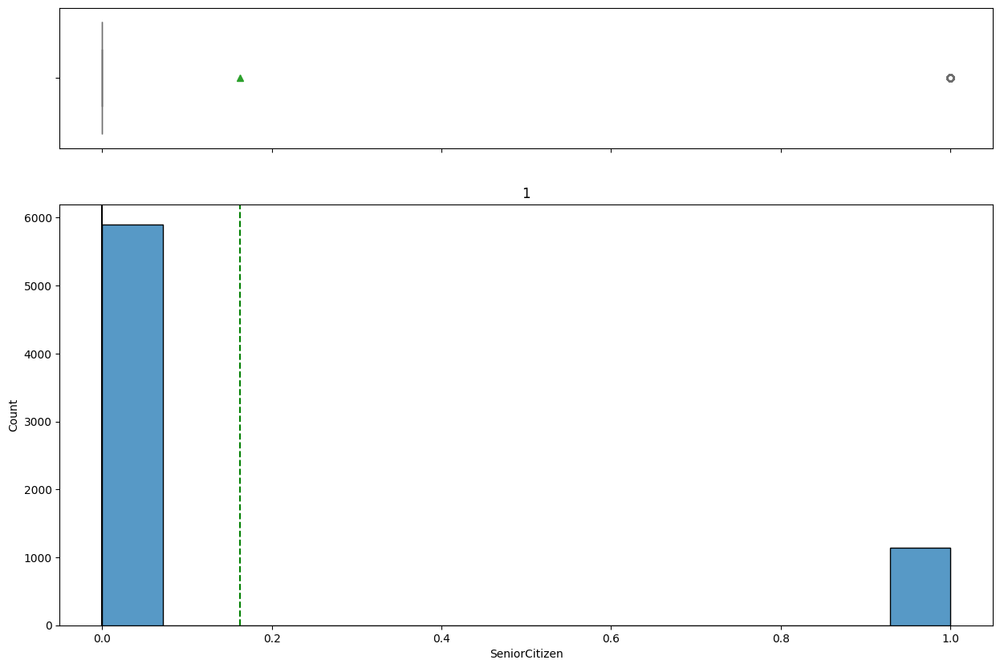

<Figure size 640x480 with 0 Axes>

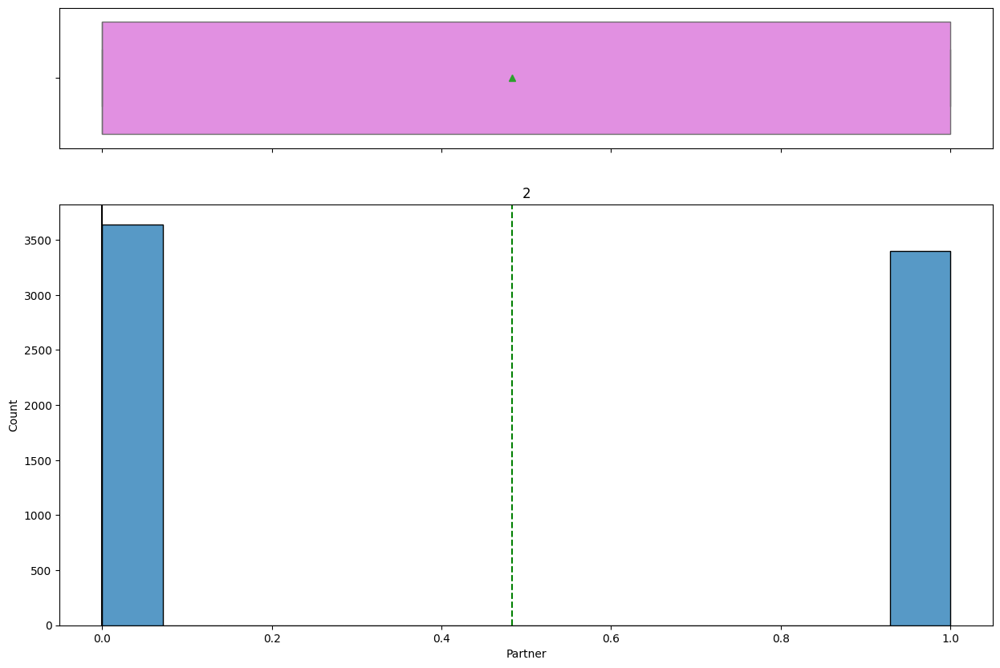

<Figure size 640x480 with 0 Axes>

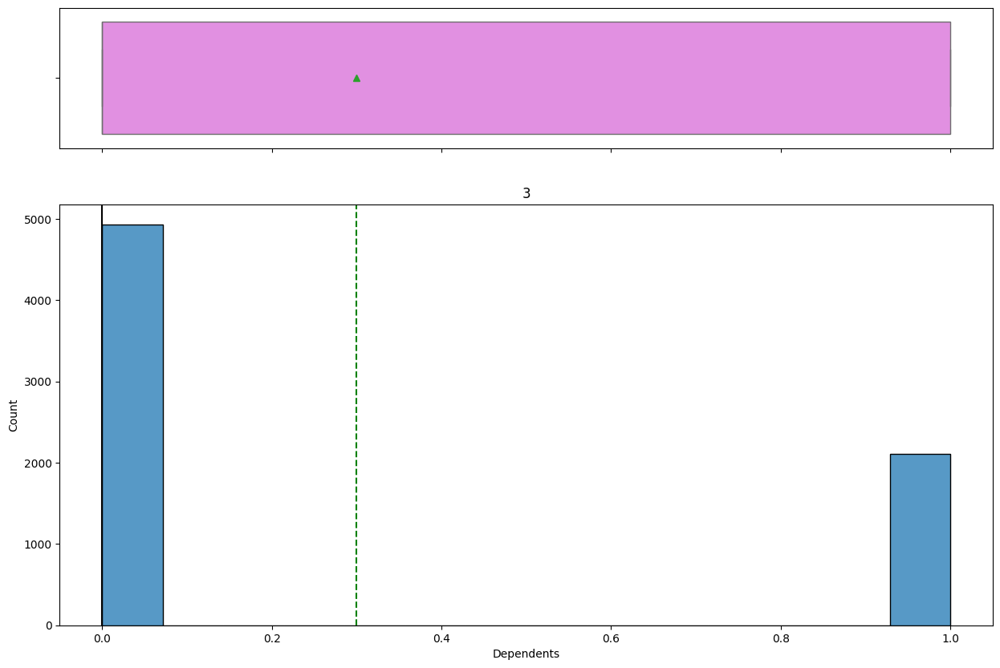

<Figure size 640x480 with 0 Axes>

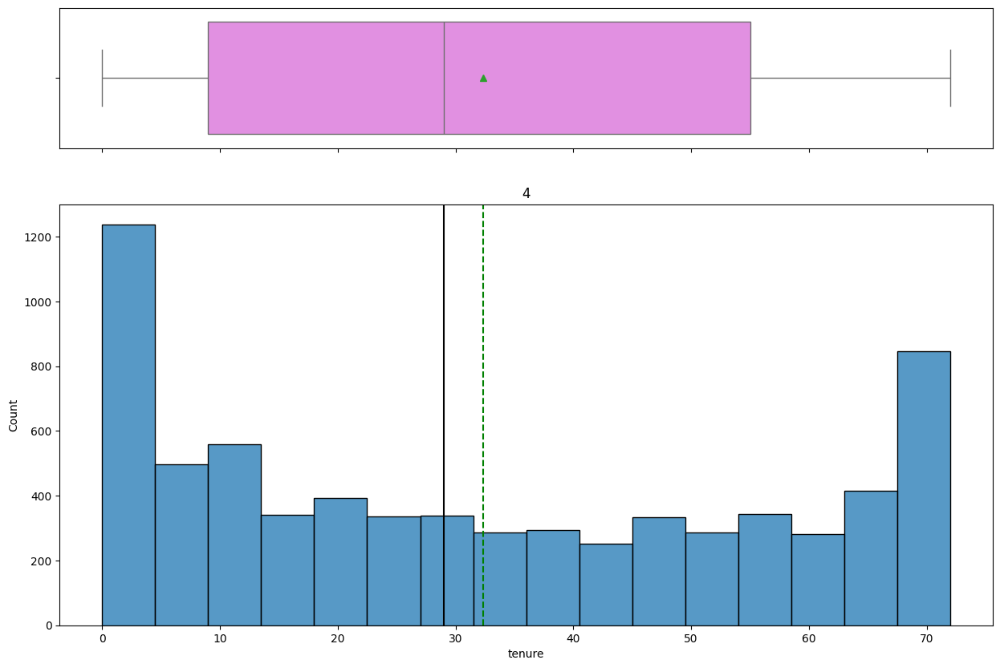

<Figure size 640x480 with 0 Axes>

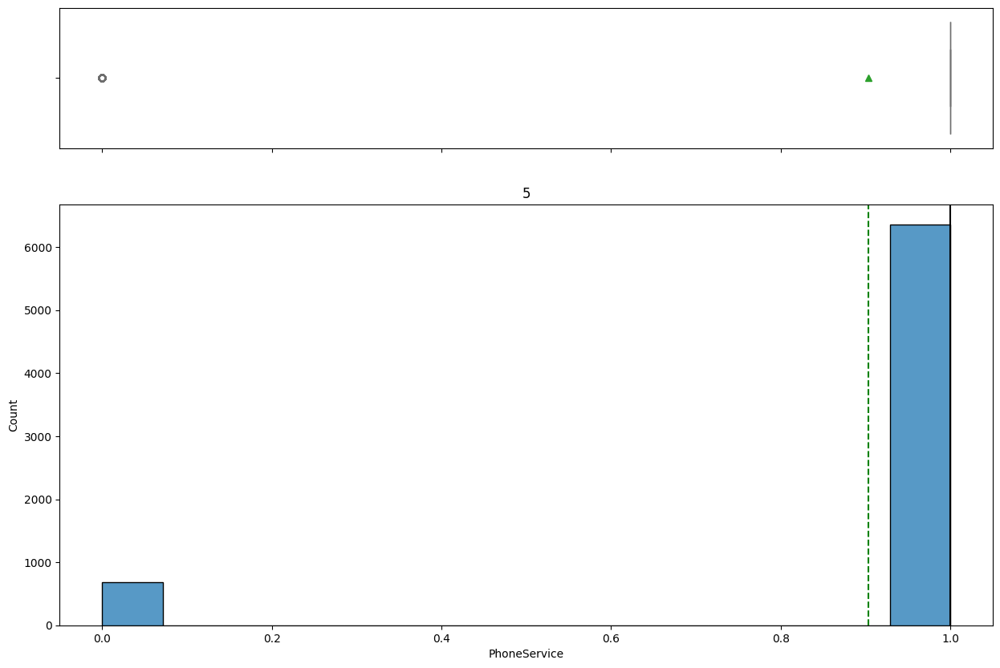

<Figure size 640x480 with 0 Axes>

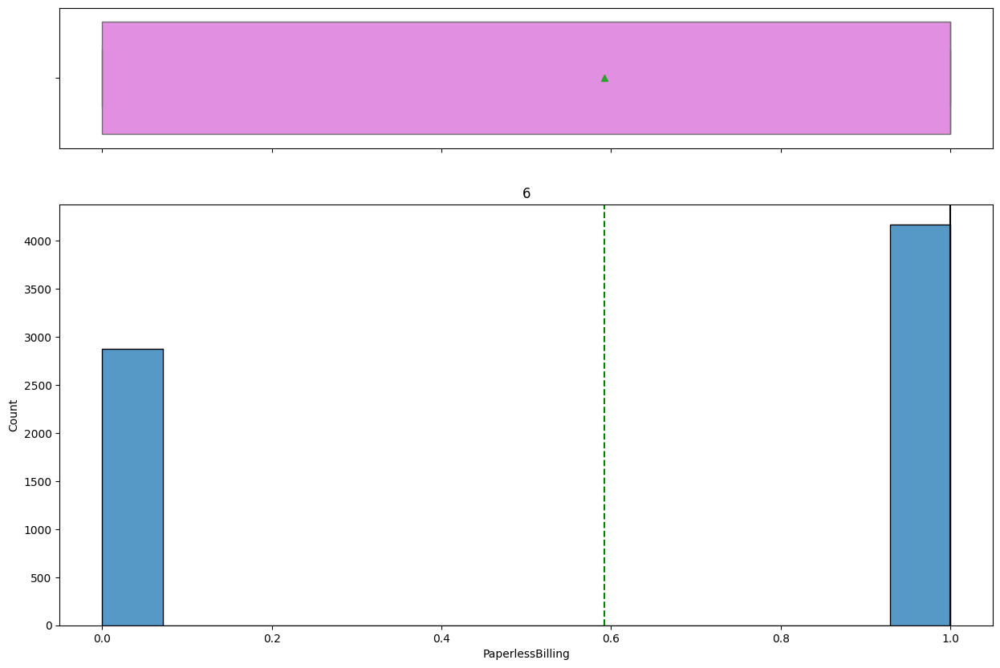

<Figure size 640x480 with 0 Axes>

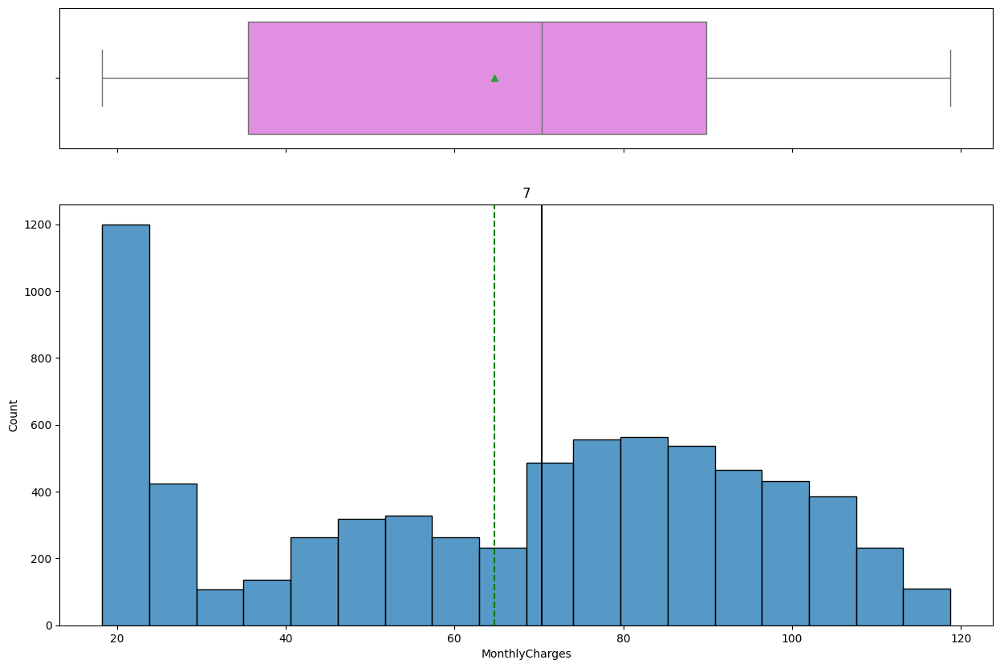

<Figure size 640x480 with 0 Axes>

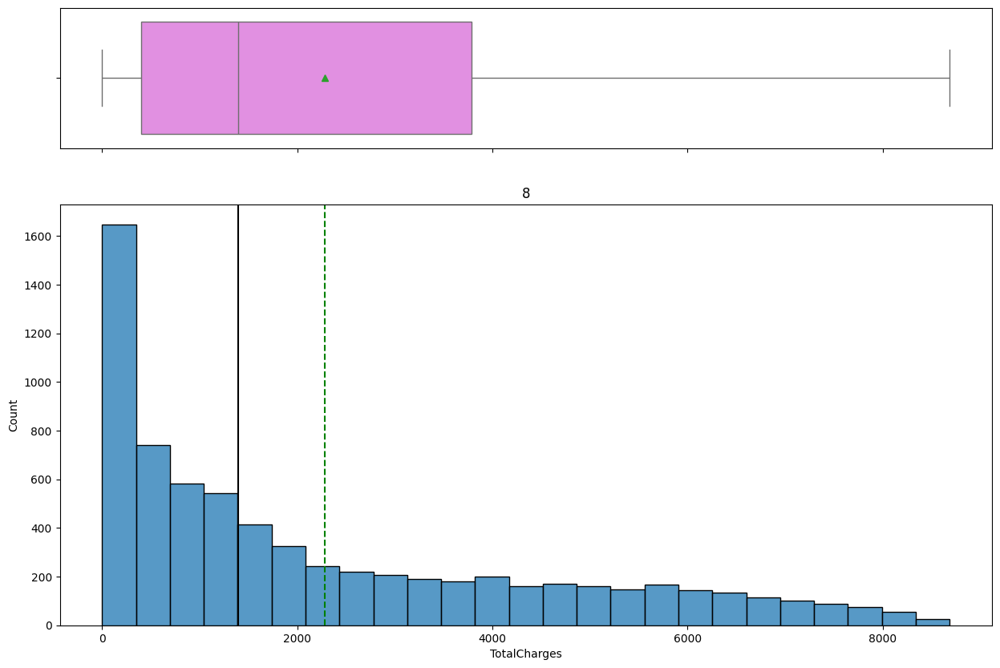

<Figure size 640x480 with 0 Axes>

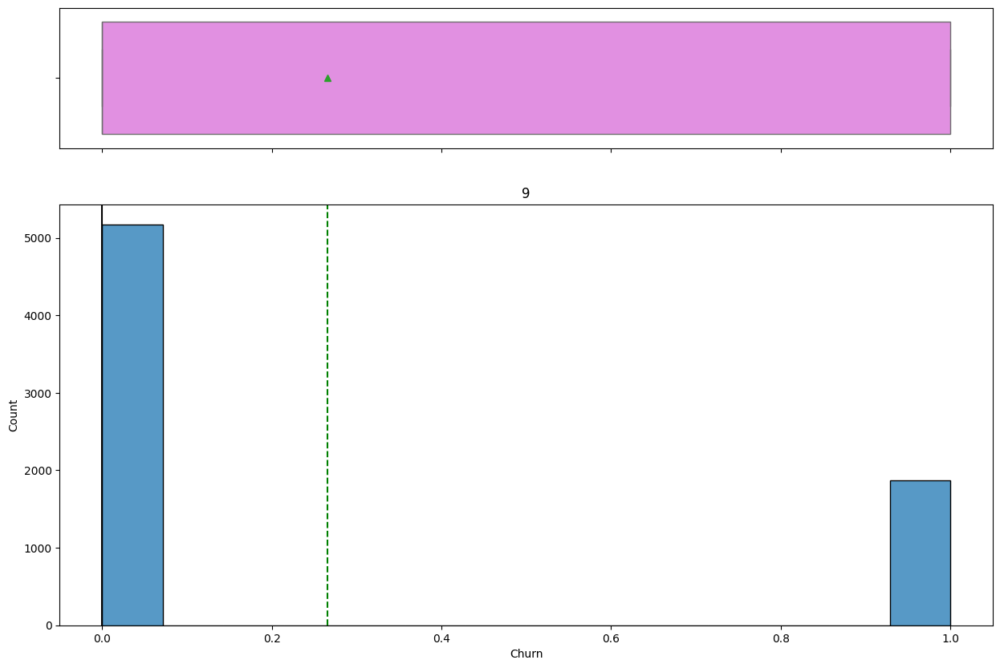

<Figure size 640x480 with 0 Axes>

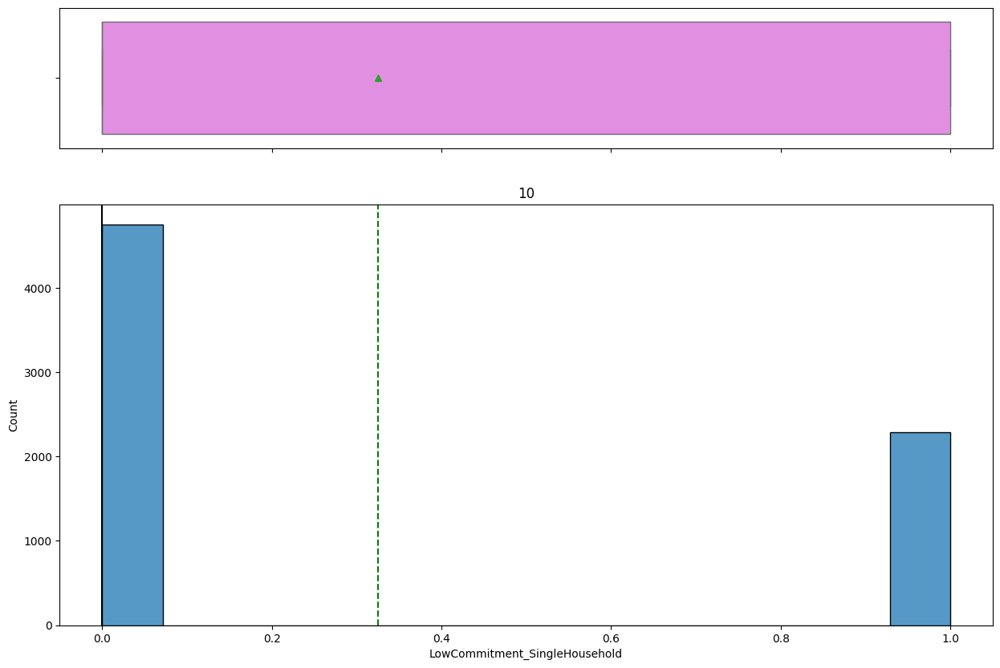

In [ ]:
# Check for continuous data types
continuous_cols = df_final.select_dtypes(include=[np.number])  # Select numeric columns

# Loop through continuous columns
for col in continuous_cols.columns:
  if df_final[col].dtype == object:
        continue
  plt.figure()  # Create a new figure for each plot
  histogram_boxplot(df_final, col)  # Pass the column name (feature)

    # Extract the column title from the DataFrame
  col_title = df_final.columns.get_loc(col)  # Get the column index and use it to retrieve the title
  plt.title(col_title)  # Set the plot title using the column title
  plt.show()

- The median totalCharges paid is 2200 dollars.
- TotalChrges is heavily skewed to the left, with the largest proprtion of customers paying close to 0 totalCharge(these might be new customers).

##Bivariate Analysis

###Plotting Correlation heatmap

In [ ]:
# creating a list of numerical columns
num_cols = df_final.select_dtypes(include=[np.number, bool]).columns.tolist()

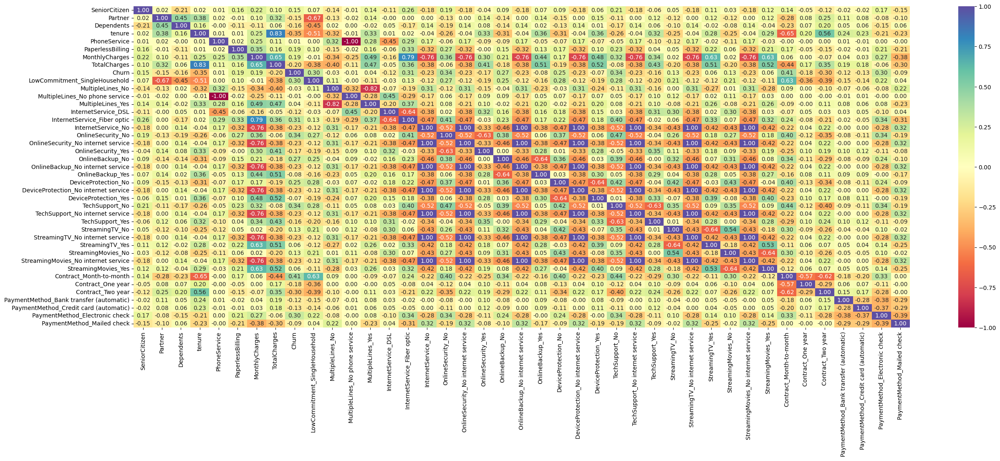

In [ ]:
#plotting correlation heat map
plt.figure(figsize=(30, 10))
sns.heatmap(
    df_final[num_cols].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")

plt.show()

###TotalCharge vs Churn

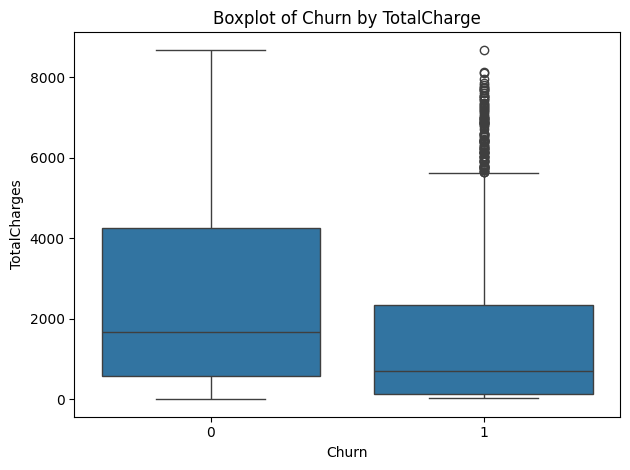

In [ ]:
plt.figure()
sns.boxplot(data = df_final,x = 'Churn' , y = 'TotalCharges')
plt.title('Boxplot of Churn by TotalCharges')
plt.tight_layout()
plt.show();

- It appears customers who pay less than 2000 dollars are more likely to churn.
- This might indicate that these customers do not stay long enough in the company to accrue higher TotalCharge.

###TotalCharge vs Partner

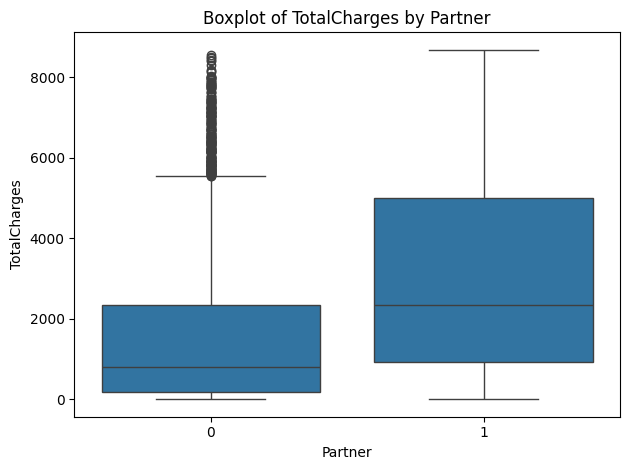

In [ ]:
plt.figure()
sns.boxplot(data = df_final,x = 'Partner' , y = 'TotalCharges')
plt.title('Boxplot of TotalCharges by Partner')
plt.tight_layout()
plt.show();

- Customers with partners are more likely to spend over 2000dollars at the end of their contract.
- Again, this point to committed customers with families, they are more likely to pay for more services and spend more time with the company by subscribing to longer services thus accruing more TotalCharge during the period.

###TotalCharges vs MultipleLines_yes

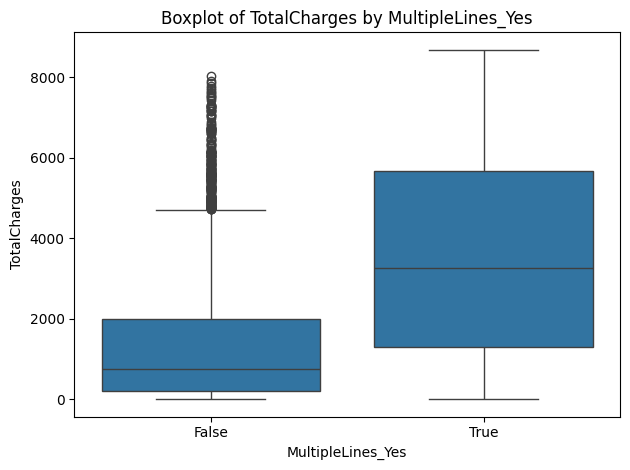

In [ ]:
plt.figure()
sns.boxplot(data = df_final,x = 'MultipleLines_Yes' , y = 'TotalCharges')
plt.title('Boxplot of TotalCharges by MultipleLines_Yes')
plt.tight_layout()
plt.show();

- Customers who spend more than 2000 dollars in Total Charge are very likely to thave multiple lines.
- Again, this points to a segment of commited customers with families(likely mid to senior profesionals, family men and women) that purchase extra lines for home and work, as well as , dependents.

###TotalCharge vs Multiplelines_No

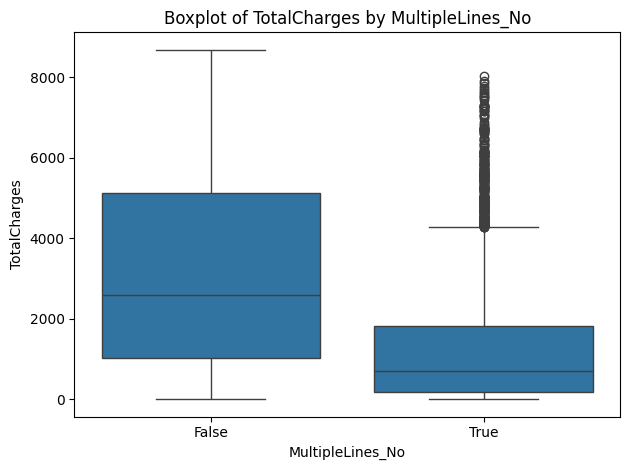

In [ ]:
plt.figure()
sns.boxplot(data = df_final,x = 'MultipleLines_No' , y = 'TotalCharges')
plt.title('Boxplot of TotalCharges by MultipleLines_No')
plt.tight_layout()
plt.show();

- Reverse of the findings of the last charge.
- Likely reflecting the non commited_non dependent customer segment.

###Churn vs MultipleLines_Yes

<Figure size 640x480 with 0 Axes>

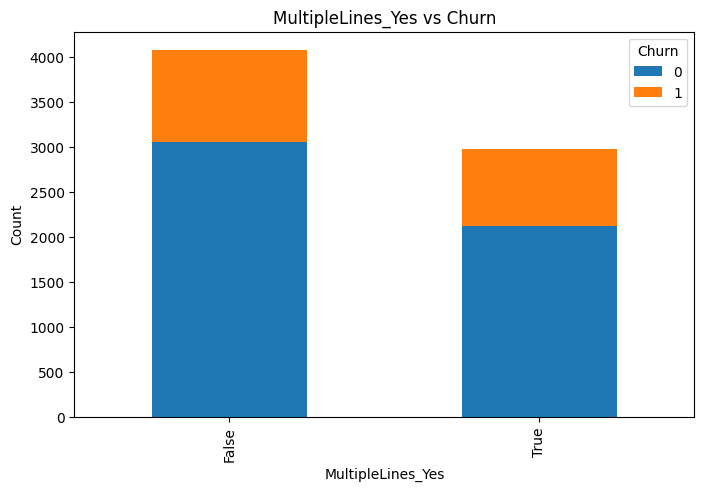

In [ ]:
plt.figure()
plt.show();
stacked_barplot( df_final,'MultipleLines_Yes', 'Churn')
plt.show();

-There is no direct link between churn and multiple lines.

###Churn vs MultipleLines_No

<Figure size 640x480 with 0 Axes>

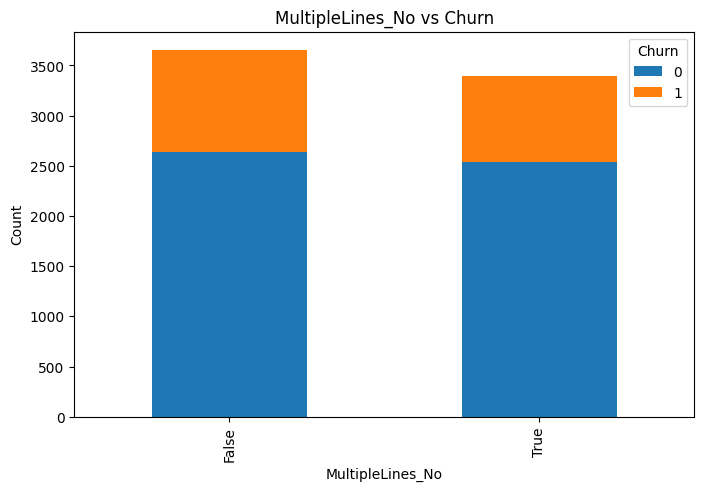

In [ ]:
plt.figure()
plt.show();
stacked_barplot( df_final,'MultipleLines_No', 'Churn')
plt.show();

-There is no direct link between churn and multiple lines.

###Churn vs LowCommitment_SingleHousehold

<Figure size 640x480 with 0 Axes>

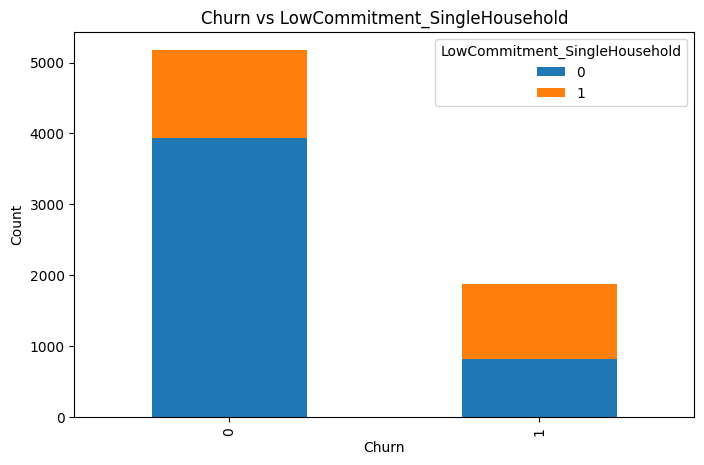

- There is 50% chance of LowCommitment_SingleHousehold to churn compared to the opposite groups whose chances are just  20%.


###Boxplot of LowCommitment_SingleHousehold by MonthlyCharges

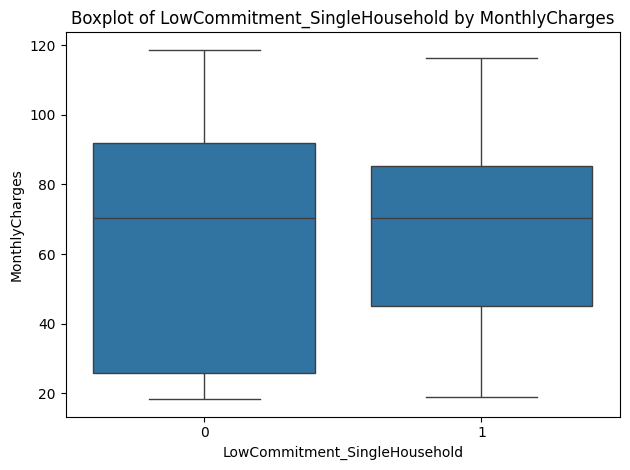

In [ ]:
plt.figure()
sns.boxplot(data = df_final,x = 'LowCommitment_SingleHousehold' , y = 'MonthlyCharges')
plt.title('Boxplot of LowCommitment_SingleHousehold by MonthlyCharges')
plt.tight_layout()
plt.show();

- The range of monthly charge for the non-LowCommitment_SingleHousehold segment is wider compared to LowCommitment_SingleHousehold(they spend as low as $20 dollars to as high as 80 dollars monthly). This might indicate that they have access to more discounts because of their loyalty and they also tend to spend more because they use more services monthly when compared LowCommitment_SingleHousehold customer segment.

###Boxplot of LowCommitment_SingleHousehold by TotalCharges

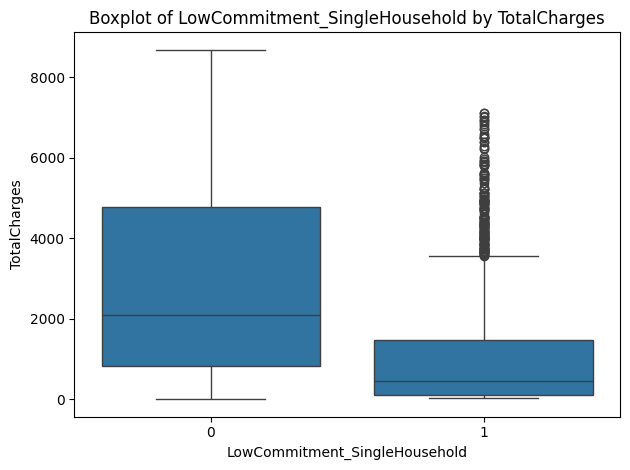

In [ ]:
plt.figure()
sns.boxplot(data = df_final,x = 'LowCommitment_SingleHousehold' , y = 'TotalCharges')
plt.title('Boxplot of LowCommitment_SingleHousehold by TotalCharges')
plt.tight_layout()
plt.show();

- The LowCommitment_SingleHousehold customer segment hardly spend up to $2000 at the end of their contract. This might be driven by the fact that they do not use a lot of additional services, they prefer month-to-month  contracts where they can easily skip months, and they hardly stay with company up to a year as revealed in my earlier visualizatons.

<Figure size 640x480 with 0 Axes>

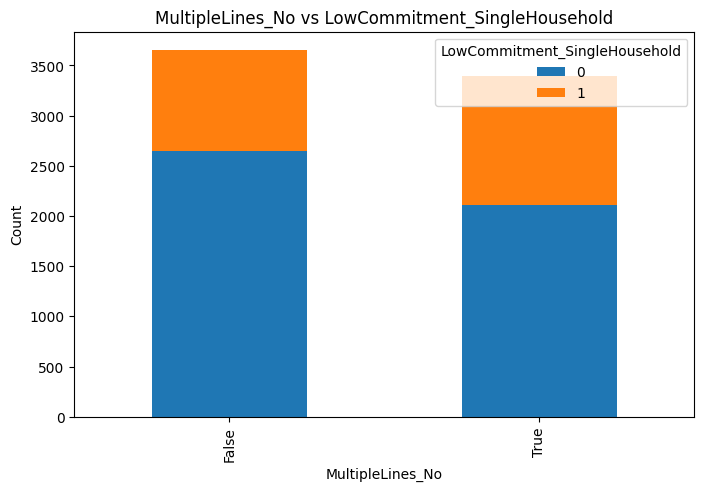

In [ ]:
plt.figure()
plt.show();
stacked_barplot( df_final,'MultipleLines_No', 'LowCommitment_SingleHousehold')
plt.show();

- No significant finding.

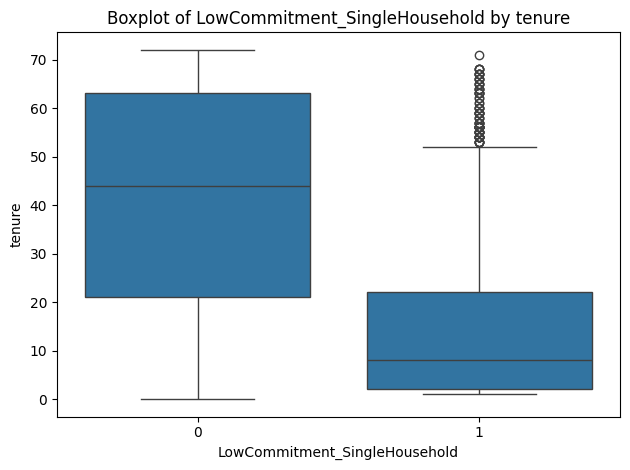

In [ ]:
plt.figure()
sns.boxplot(data = df_final,x = 'LowCommitment_SingleHousehold' , y = 'tenure')
plt.title('Boxplot of LowCommitment_SingleHousehold by tenure')
plt.tight_layout()
plt.show();

- The LowCommitment_SingleHousehold hard remains with the company beyond 20 months.

<Figure size 640x480 with 0 Axes>

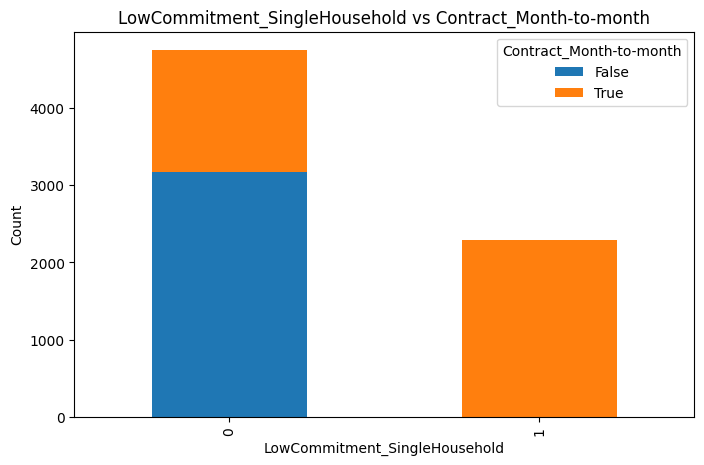

In [ ]:
plt.figure()
plt.show();
stacked_barplot( df_final,'LowCommitment_SingleHousehold','Contract_Month-to-month', )
plt.show();

- Clearly shows the preference of LowCommitment_SingleHousehold for month-to-month contracts.

<Figure size 640x480 with 0 Axes>

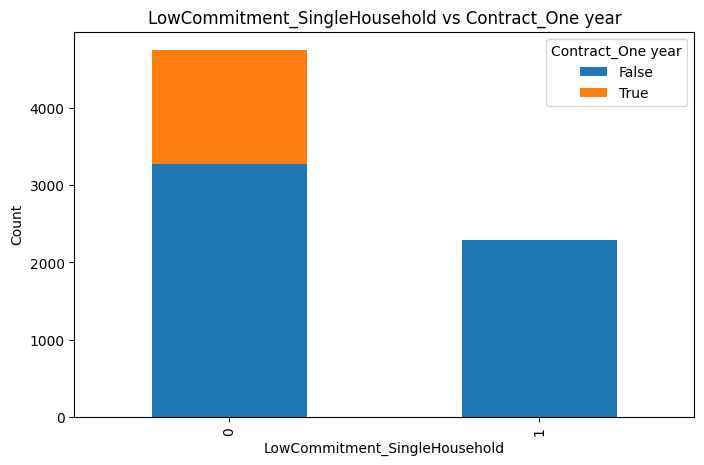

In [ ]:
plt.figure()
plt.show();
stacked_barplot( df_final,'LowCommitment_SingleHousehold','Contract_One year' )
plt.show();

- One year contract is not popuplar among the  LowCommitment_SingleHousehold customer segment.

<Figure size 640x480 with 0 Axes>

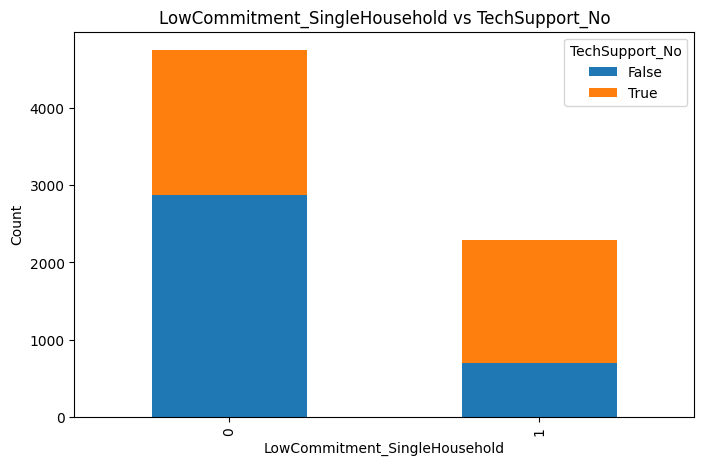

In [ ]:
plt.figure()
plt.show();
stacked_barplot( df_final,'LowCommitment_SingleHousehold','TechSupport_No' )
plt.show();

- The LowCommitment_SingleHousehold are tech sarvy and a hardly use additional services that might require tech supports. Hence their very little use of tech support services from this visualization.

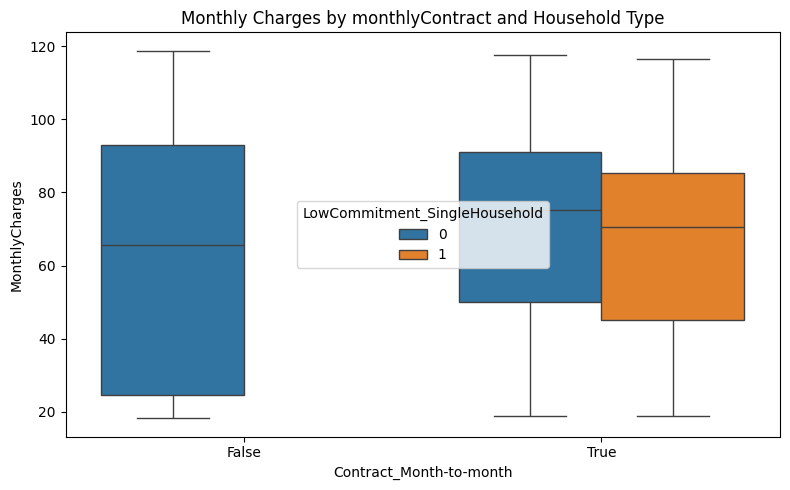

In [ ]:
plt.figure(figsize=(8,5))
sns.boxplot(
    data=df_final,
    x="Contract_Month-to-month",
    y="MonthlyCharges",
    hue="LowCommitment_SingleHousehold"
)
plt.title("Monthly Charges by monthlyContract and Household Type")
plt.tight_layout()
plt.show()


- Clearly shows that if a customer under LowCommitment_SingleHousehold segment spends above $80 monthly, he is more likely to churn due to better offers from other company.

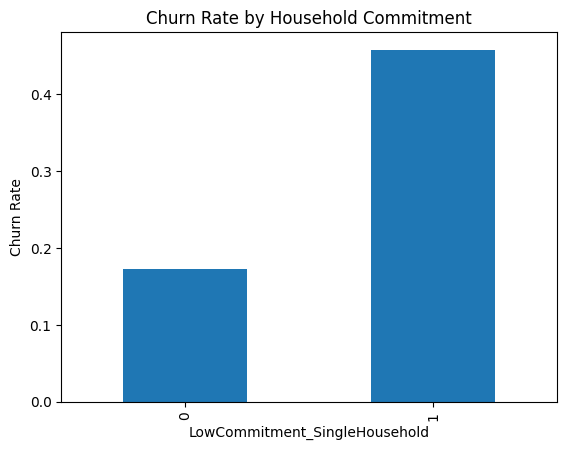

In [ ]:
churn_rate = (
    df_final
    .groupby("LowCommitment_SingleHousehold")["Churn"]
    .mean()
)

churn_rate.plot(kind="bar", title="Churn Rate by Household Commitment")
plt.ylabel("Churn Rate")
plt.show()


= Clearly show LowCommitment_SingleHousehold customer segment twice more likely to churn compared to the non-LowCommitment_SingleHousehold customer segment.

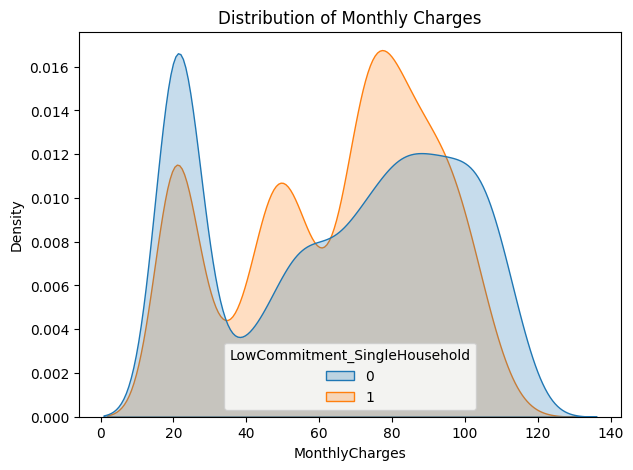

In [ ]:
plt.figure(figsize=(7,5))
sns.kdeplot(
    data=df_final,
    x="MonthlyCharges",
    hue="LowCommitment_SingleHousehold",
    fill=True,
    common_norm=False
)
plt.title("Distribution of Monthly Charges")
plt.show()


- Highlights a high density of LowCommitment_SingleHousehold who pay as high as $80 monthly, and a high density of non-LowCommitment_SingleHousehold who pay as low as $20 monthly due to the reasons highlighted earlier.

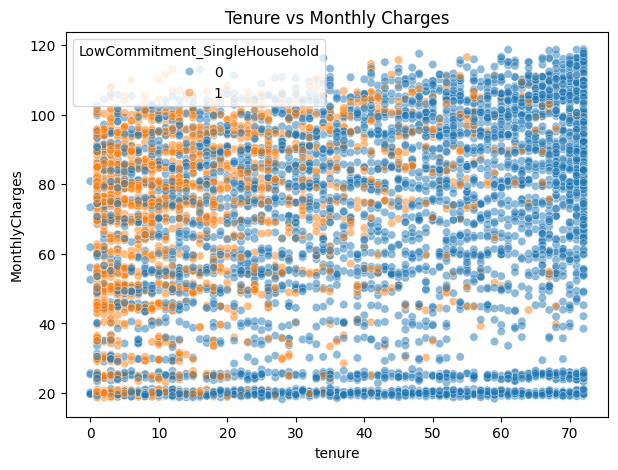

In [ ]:
plt.figure(figsize=(7,5))
sns.scatterplot(
    data=df_final,
    x="tenure",
    y="MonthlyCharges",
    hue="LowCommitment_SingleHousehold",
    alpha=0.5
)
plt.title("Tenure vs Monthly Charges")
plt.show()



-  The LowCommitment_SingleHousehold spend shorter time with the company and spend more.

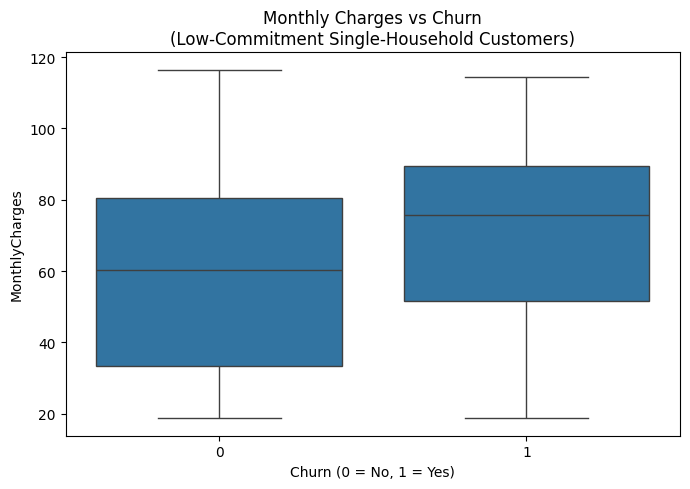

In [ ]:
subset = df_final[df_final["LowCommitment_SingleHousehold"] == 1]

plt.figure(figsize=(7,5))
sns.boxplot(
    data=subset,
    x="Churn",
    y="MonthlyCharges"
)
plt.title("Monthly Charges vs Churn\n(Low-Commitment Single-Household Customers)")
plt.xlabel("Churn (0 = No, 1 = Yes)")
plt.tight_layout()
plt.show()


- Because the population that churn more often belong to the LowCommitment_SingleHousehold, those that most likely to churn usually spend at least $80 dollars monthly.
- As I mntioned earlier, becuase the LowCommitment_SingleHousehold miss out of discounts because of their preference for the more expensive month-to-month contracts they are more likely to spend more monthly.

#Model Building

##Model Evaluation Criteria

The nature of predictions made by the models will translate as follows:

- True positives (TP) are customer churn correctly predicted by the model.
- False negatives (FN) are customers who actually churned but was not detected by the model.
- False positives (FP) are customer who remained with company in reality but was wrongly flagged as churn by the model.
- - True Negative (TN) are customer who did not and was correctly predicted by the model

**Which metric to optimize?**

- We need to choose the metric which will ensure that caters well for Recall, thus reducing false negative to bare minimum.
- A model with strong Recall performance will ensure that we don't miss out any customer will likely be lost, and campaigns and promos to keep them will be prioritized.
- There is also consideration for the possibility of the model incorrectly flagging churn for a client who will not churn. This might lead to wasting money to keep customers who would not have even churned. This can carry particularly financial consequences if the campaigns are expensive.
- This indicates my model should have a good balance between precision and Recall, just to address my concerns.
- Another thing to consider, is that the prediction class is markedly imbalanced, hence whatever metrics to be choosen should work well with Imbalance prediction class. The "Precision-Recall Area under the curve"(PR-AUC) metric appears to  be the best metric for predicting imbalanced prediction class in churn analysis.
- For this project, my primary metric will be ''PR-AUC". However, I will also test my model performance with Recall, precision, accuracy, ROC-AUC, and F1-SCORE for COMPARISM and tuning purposes.

**Let's define a function to output different metrics  on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

##Model Building with original data

I will be building multiple models on training data, I will use the K-FOLD cross validation to assess performance on the training set, while validating performance on a validation set.

Building multiple models with original data

  I will be building the following models

  1. Lasso
  2. Ridge
  3. Adaboost
  4. Bagging
  5. GBM
  6. XG boost
  7. RandomForest
  8. Logistic Regression
  9. Decision Tree

In [ ]:
%%time
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score
)

models = []

models.append(("dtree", DecisionTreeClassifier(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

models.append(("RIDGE", RidgeClassifier(random_state=1, alpha=0.3)))
models.append(("LOGISTIC REGRESSION", LogisticRegression(random_state=1)))
models.append(("Lasso", LogisticRegression(random_state=1, penalty="l1", solver="liblinear", C=3.0)))

# ================================
# CROSS-VALIDATION METRICS
# ================================
scoring = {
    "Accuracy": "accuracy",
    "Precision": "precision",
    "Recall": "recall",
    "F1": "f1",
    "ROC_AUC": "roc_auc",
    "PR_AUC": "average_precision",
}

print("\nCross-Validation performance on training dataset:\n")

for name, model in models:
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

    cv_results = cross_validate(
        estimator=model,
        X=X_train,
        y=y_train,
        scoring=scoring,
        cv=kfold
    )

    print(
        f"{name} | "
        f"Acc: {cv_results['test_Accuracy'].mean():.3f} | "
        f"Prec: {cv_results['test_Precision'].mean():.3f} | "
        f"Recall: {cv_results['test_Recall'].mean():.3f} | "
        f"F1: {cv_results['test_F1'].mean():.3f} | "
        f"ROC-AUC: {cv_results['test_ROC_AUC'].mean():.3f} | "
        f"PR-AUC: {cv_results['test_PR_AUC'].mean():.3f}"
    )

# ================================
# TEST SET METRICS
# ================================
print("\nValidation Performance (Test Set):\n")

for name, model in models:
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    # Probabilities / decision scores
    if hasattr(model, "predict_proba"):
        y_scores = model.predict_proba(X_test)[:, 1]
    else:
        y_scores = model.decision_function(X_test)

    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_scores)
    pr_auc = average_precision_score(y_test, y_scores)

    print(
        f"{name} | "
        f"Acc: {acc:.3f} | "
        f"Prec: {prec:.3f} | "
        f"Recall: {recall:.3f} | "
        f"F1: {f1:.3f} | "
        f"ROC-AUC: {roc_auc:.3f} | "
        f"PR-AUC: {pr_auc:.3f}"
    )



Cross-Validation performance on training dataset:

dtree | Acc: 0.726 | Prec: 0.486 | Recall: 0.501 | F1: 0.493 | ROC-AUC: 0.655 | PR-AUC: 0.378
Bagging | Acc: 0.772 | Prec: 0.593 | Recall: 0.452 | F1: 0.513 | ROC-AUC: 0.790 | PR-AUC: 0.549
Random forest | Acc: 0.789 | Prec: 0.636 | Recall: 0.482 | F1: 0.548 | ROC-AUC: 0.827 | PR-AUC: 0.616
GBM | Acc: 0.800 | Prec: 0.656 | Recall: 0.524 | F1: 0.582 | ROC-AUC: 0.848 | PR-AUC: 0.658
Adaboost | Acc: 0.801 | Prec: 0.650 | Recall: 0.545 | F1: 0.592 | ROC-AUC: 0.848 | PR-AUC: 0.659
Xgboost | Acc: 0.783 | Prec: 0.607 | Recall: 0.518 | F1: 0.558 | ROC-AUC: 0.824 | PR-AUC: 0.612
RIDGE | Acc: 0.797 | Prec: 0.651 | Recall: 0.515 | F1: 0.574 | ROC-AUC: 0.838 | PR-AUC: 0.641
LOGISTIC REGRESSION | Acc: 0.800 | Prec: 0.647 | Recall: 0.540 | F1: 0.589 | ROC-AUC: 0.845 | PR-AUC: 0.651
Lasso | Acc: 0.801 | Prec: 0.649 | Recall: 0.548 | F1: 0.594 | ROC-AUC: 0.847 | PR-AUC: 0.652

Validation Performance (Test Set):

dtree | Acc: 0.728 | Prec: 0.488 | Rec

In [ ]:
results_nosampling = []

for name, model in models:   #

    # Fit model on original training data
    model.fit(X_train, y_train)

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Probabilities / decision scores
    if hasattr(model, "predict_proba"):
        y_train_prob = model.predict_proba(X_train)[:, 1]
        y_test_prob = model.predict_proba(X_test)[:, 1]
    else:
        y_train_prob = model.decision_function(X_train)
        y_test_prob = model.decision_function(X_test)

    results_nosampling.append({
        "Model": name,

        # ---- TRAIN METRICS ----
        "Train Recall": recall_score(y_train, y_train_pred),
        "Train Precision": precision_score(y_train, y_train_pred),
        "Train F1": f1_score(y_train, y_train_pred),
        "Train Accuracy": accuracy_score(y_train, y_train_pred),
        "Train ROC-AUC": roc_auc_score(y_train, y_train_prob),
        "Train PR-AUC": average_precision_score(y_train, y_train_prob),

        # ---- TEST METRICS ----
        "Test Recall": recall_score(y_test, y_test_pred),
        "Test Precision": precision_score(y_test, y_test_pred),
        "Test F1": f1_score(y_test, y_test_pred),
        "Test Accuracy": accuracy_score(y_test, y_test_pred),
        "Test ROC-AUC": roc_auc_score(y_test, y_test_prob),
        "Test PR-AUC": average_precision_score(y_test, y_test_prob),
    })

# Create DataFrame
performance_table_nosampling = pd.DataFrame(results_nosampling)

# Sort by Test PR-AUC (best churn metric)
performance_table_nosampling = performance_table_nosampling.sort_values(
    by="Test PR-AUC", ascending=False
).reset_index(drop=True)

performance_table_nosampling


,Model,Train Recall,Train Precision,Train F1,Train Accuracy,Train ROC-AUC,Train PR-AUC,Test Recall,Test Precision,Test F1,Test Accuracy,Test ROC-AUC,Test PR-AUC
0,Adaboost,0.555,0.663,0.604,0.807,0.855,0.665,0.527,0.657,0.585,0.801,0.838,0.668
1,GBM,0.574,0.715,0.637,0.826,0.884,0.738,0.516,0.677,0.586,0.806,0.837,0.666
2,Lasso,0.556,0.654,0.601,0.804,0.852,0.661,0.553,0.666,0.604,0.808,0.835,0.659
3,LOGISTIC REGRESSION,0.556,0.657,0.602,0.805,0.851,0.659,0.561,0.667,0.610,0.809,0.835,0.659
4,RIDGE,0.519,0.655,0.579,0.800,0.843,0.648,0.513,0.669,0.581,0.803,0.826,0.641
5,Random forest,0.995,0.997,0.996,0.998,1.000,1.000,0.487,0.623,0.547,0.786,0.815,0.621
6,Xgboost,0.867,0.910,0.888,0.942,0.986,0.958,0.545,0.616,0.579,0.789,0.819,0.620
7,Bagging,0.948,0.986,0.967,0.983,0.999,0.995,0.447,0.607,0.515,0.776,0.789,0.560
8,dtree,0.992,1.000,0.996,0.998,1.000,1.000,0.497,0.488,0.493,0.728,0.660,0.380


- Adaboost model is the best model, with the best performance and least overfitting here in the PR-AUC metrics.

##Model Building with Oversampled data

- Since the predictor class is imbalanced, I want to experiment the models on oversampled data set using SMOTE.

In [ ]:
models_oversampled = [
    ("dtree", DecisionTreeClassifier(random_state=1)),
    ("Bagging", BaggingClassifier(random_state=1)),
    ("Random forest", RandomForestClassifier(random_state=1)),
    ("GBM", GradientBoostingClassifier(random_state=1)),
    ("Adaboost", AdaBoostClassifier(random_state=1)),
    ("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")),
    ("RIDGE", RidgeClassifier(random_state=1, alpha=0.3)),
    ("LASSO", LogisticRegression(random_state=1, penalty="l1", solver="liblinear", C=3.0)),
    ("LOGISTIC REGRESSION", LogisticRegression(random_state=1)),
]


In [ ]:
scoring = {
    "recall": "recall",
    "precision": "precision",
    "f1": "f1",
    "accuracy": "accuracy",
    "roc_auc": "roc_auc",
    "pr_auc": "average_precision"
}


In [ ]:
print("\nCross-Validation Performance (SMOTE applied correctly):\n")

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

for name, model in models_oversampled:
    pipeline = Pipeline(
        steps=[
            ("smote", SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)),
            ("model", model),
        ]
    )

    cv_results = cross_validate(
        estimator=pipeline,
        X=X_train,
        y=y_train,
        cv=cv,
        scoring=scoring,
        n_jobs=-1
    )

    print(f"{name}")
    print(f"  Recall     : {cv_results['test_recall'].mean():.4f}")
    print(f"  Precision  : {cv_results['test_precision'].mean():.4f}")
    print(f"  F1-score   : {cv_results['test_f1'].mean():.4f}")
    print(f"  Accuracy   : {cv_results['test_accuracy'].mean():.4f}")
    print(f"  ROC-AUC    : {cv_results['test_roc_auc'].mean():.4f}")
    print(f"  PR-AUC     : {cv_results['test_pr_auc'].mean():.4f}\n")



Cross-Validation Performance (SMOTE applied correctly):

dtree
  Recall     : 0.5425
  Precision  : 0.5049
  F1-score   : 0.5226
  Accuracy   : 0.7373
  ROC-AUC    : 0.6757
  PR-AUC     : 0.3962

Bagging
  Recall     : 0.4883
  Precision  : 0.5767
  F1-score   : 0.5286
  Accuracy   : 0.7689
  ROC-AUC    : 0.7898
  PR-AUC     : 0.5400

Random forest
  Recall     : 0.5291
  Precision  : 0.6058
  F1-score   : 0.5642
  Accuracy   : 0.7835
  ROC-AUC    : 0.8235
  PR-AUC     : 0.5970

GBM
  Recall     : 0.6120
  Precision  : 0.6044
  F1-score   : 0.6078
  Accuracy   : 0.7904
  ROC-AUC    : 0.8440
  PR-AUC     : 0.6511

Adaboost
  Recall     : 0.6682
  Precision  : 0.5790
  F1-score   : 0.6190
  Accuracy   : 0.7819
  ROC-AUC    : 0.8407
  PR-AUC     : 0.6397

Xgboost
  Recall     : 0.5512
  Precision  : 0.5930
  F1-score   : 0.5710
  Accuracy   : 0.7803
  ROC-AUC    : 0.8238
  PR-AUC     : 0.6118

RIDGE
  Recall     : 0.6341
  Precision  : 0.5987
  F1-score   : 0.6152
  Accuracy   : 0.7895
 

In [ ]:
print("\nValidation Performance (SMOTE-trained models):\n")

for name, model in models_oversampled:
    pipeline = Pipeline(
        steps=[
            ("smote", SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)),
            ("model", model),
        ]
    )

    pipeline.fit(X_train, y_train)

    y_pred = pipeline.predict(X_test)
    y_prob = pipeline.predict_proba(X_test)[:, 1] if hasattr(
        pipeline.named_steps["model"], "predict_proba"
    ) else None

    print(f"{name}")
    print(f"  Recall     : {recall_score(y_test, y_pred):.4f}")
    print(f"  Precision  : {precision_score(y_test, y_pred):.4f}")
    print(f"  F1-score   : {f1_score(y_test, y_test):.4f}")
    print(f"  Accuracy   : {accuracy_score(y_test, y_pred):.4f}")

    if y_prob is not None:
        print(f"  ROC-AUC    : {roc_auc_score(y_test, y_prob):.4f}")
        print(f"  PR-AUC     : {average_precision_score(y_test, y_prob):.4f}")

    print()



Validation Performance (SMOTE-trained models):

dtree
  Recall     : 0.4840
  Precision  : 0.4404
  F1-score   : 1.0000
  Accuracy   : 0.6998
  ROC-AUC    : 0.6320
  PR-AUC     : 0.3510

Bagging
  Recall     : 0.5000
  Precision  : 0.5719
  F1-score   : 1.0000
  Accuracy   : 0.7679
  ROC-AUC    : 0.7823
  PR-AUC     : 0.5241

Random forest
  Recall     : 0.5214
  Precision  : 0.5945
  F1-score   : 1.0000
  Accuracy   : 0.7786
  ROC-AUC    : 0.8082
  PR-AUC     : 0.5803

GBM
  Recall     : 0.6203
  Precision  : 0.6105
  F1-score   : 1.0000
  Accuracy   : 0.7942
  ROC-AUC    : 0.8345
  PR-AUC     : 0.6598

Adaboost
  Recall     : 0.6471
  Precision  : 0.5708
  F1-score   : 1.0000
  Accuracy   : 0.7771
  ROC-AUC    : 0.8278
  PR-AUC     : 0.6383

Xgboost
  Recall     : 0.5401
  Precision  : 0.5658
  F1-score   : 1.0000
  Accuracy   : 0.7679
  ROC-AUC    : 0.8099
  PR-AUC     : 0.6133

RIDGE
  Recall     : 0.6283
  Precision  : 0.6057
  F1-score   : 1.0000
  Accuracy   : 0.7928

LASSO
  R

In [ ]:
results = []

for name, model in models_oversampled:

    # SMOTE only applied to TRAINING data
    pipeline = Pipeline(
        steps=[
            ("smote", SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)),
            ("model", model),
        ]
    )

    # Fit on training data
    pipeline.fit(X_train, y_train)

    # Predictions
    y_train_pred = pipeline.predict(X_train)
    y_test_pred = pipeline.predict(X_test)

    # Probabilities (needed for AUCs)
    if hasattr(pipeline.named_steps["model"], "predict_proba"):
        y_train_prob = pipeline.predict_proba(X_train)[:, 1]
        y_test_prob = pipeline.predict_proba(X_test)[:, 1]
    else:
        y_train_prob = pipeline.decision_function(X_train)
        y_test_prob = pipeline.decision_function(X_test)

    results.append({
        "Model": name,

        # ---- TRAIN METRICS ----
        "Train Recall": recall_score(y_train, y_train_pred),
        "Train Precision": precision_score(y_train, y_train_pred),
        "Train F1": f1_score(y_train, y_train_pred),
        "Train Accuracy": accuracy_score(y_train, y_train_pred),
        "Train ROC-AUC": roc_auc_score(y_train, y_train_prob),
        "Train PR-AUC": average_precision_score(y_train, y_train_prob),

        # ---- TEST METRICS ----
        "Test Recall": recall_score(y_test, y_test_pred),
        "Test Precision": precision_score(y_test, y_test_pred),
        "Test F1": f1_score(y_test, y_test_pred),
        "Test Accuracy": accuracy_score(y_test, y_test_pred),
        "Test ROC-AUC": roc_auc_score(y_test, y_test_prob),
        "Test PR-AUC": average_precision_score(y_test, y_test_prob),
    })

# Create comparison table
performance_table = pd.DataFrame(results)

# Sort by Test PR-AUC (best metric for churn)
performance_table = performance_table.sort_values(
    by="Test PR-AUC", ascending=False
).reset_index(drop=True)

performance_table


,Model,Train Recall,Train Precision,Train F1,Train Accuracy,Train ROC-AUC,Train PR-AUC,Test Recall,Test Precision,Test F1,Test Accuracy,Test ROC-AUC,Test PR-AUC
0,GBM,0.651,0.640,0.645,0.810,0.869,0.699,0.620,0.611,0.615,0.794,0.834,0.660
1,LASSO,0.613,0.626,0.620,0.800,0.849,0.655,0.610,0.626,0.618,0.800,0.832,0.648
2,Adaboost,0.658,0.590,0.622,0.788,0.848,0.656,0.647,0.571,0.607,0.777,0.828,0.638
3,RIDGE,0.638,0.604,0.621,0.793,0.841,0.645,0.628,0.606,0.617,0.793,0.827,0.636
4,Xgboost,0.866,0.871,0.868,0.930,0.980,0.939,0.540,0.566,0.553,0.768,0.810,0.613
5,LOGISTIC REGRESSION,0.621,0.576,0.598,0.778,0.830,0.620,0.610,0.564,0.586,0.771,0.813,0.602
6,Random forest,0.997,0.995,0.996,0.998,1.000,1.000,0.521,0.595,0.556,0.779,0.808,0.580
7,Bagging,0.960,0.980,0.970,0.984,0.999,0.996,0.500,0.572,0.534,0.768,0.782,0.524
8,dtree,0.993,0.999,0.996,0.998,1.000,1.000,0.484,0.440,0.461,0.700,0.632,0.351


- With the exception of Decision tree, bagging, and RandomForest every other model seems to be performing well with little overfitting.
- Lasso model seems to be the best performing here with the best performance on PR-AUC metric and very little overfitting when compared to the GBM model.

##Model Building with Undersampled Data

In [ ]:
models_un = [
    ("dtree", DecisionTreeClassifier(random_state=1)),
    ("Bagging", BaggingClassifier(random_state=1)),
    ("Random forest", RandomForestClassifier(random_state=1)),
    ("GBM", GradientBoostingClassifier(random_state=1)),
    ("Adaboost", AdaBoostClassifier(random_state=1)),
    ("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")),
    ("RIDGE", RidgeClassifier(random_state=1, alpha=0.3)),
    ("LASSO", LogisticRegression(random_state=1, penalty="l1", solver="liblinear", C=3.0)),
    ("LOGISTIC REGRESSION", LogisticRegression(random_state=1)),
    ]

In [ ]:
print("\nCross-Validation Performance (Random Undersampling applied correctly):\n")

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

for name, model in models_un:

    pipeline = Pipeline(
        steps=[
            ("undersample", RandomUnderSampler(
                sampling_strategy=1, random_state=1
            )),
            ("model", model),
        ]
    )

    cv_results = cross_validate(
        estimator=pipeline,
        X=X_train,
        y=y_train,
        cv=cv,
        scoring=scoring,
        n_jobs=-1
    )

    print(f"{name}")
    print(f"  Recall     : {cv_results['test_recall'].mean():.4f}")
    print(f"  Precision  : {cv_results['test_precision'].mean():.4f}")
    print(f"  F1-score   : {cv_results['test_f1'].mean():.4f}")
    print(f"  Accuracy   : {cv_results['test_accuracy'].mean():.4f}")
    print(f"  ROC-AUC    : {cv_results['test_roc_auc'].mean():.4f}")
    print(f"  PR-AUC     : {cv_results['test_pr_auc'].mean():.4f}\n")



Cross-Validation Performance (Random Undersampling applied correctly):

dtree
  Recall     : 0.6803
  Precision  : 0.4431
  F1-score   : 0.5365
  Accuracy   : 0.6881
  ROC-AUC    : 0.6859
  PR-AUC     : 0.3867

Bagging
  Recall     : 0.6883
  Precision  : 0.5113
  F1-score   : 0.5861
  Accuracy   : 0.7423
  ROC-AUC    : 0.8020
  PR-AUC     : 0.5498

Random forest
  Recall     : 0.7679
  Precision  : 0.5081
  F1-score   : 0.6108
  Accuracy   : 0.7405
  ROC-AUC    : 0.8298
  PR-AUC     : 0.6131

GBM
  Recall     : 0.7933
  Precision  : 0.5139
  F1-score   : 0.6232
  Accuracy   : 0.7455
  ROC-AUC    : 0.8424
  PR-AUC     : 0.6453

Adaboost
  Recall     : 0.7993
  Precision  : 0.5136
  F1-score   : 0.6247
  Accuracy   : 0.7449
  ROC-AUC    : 0.8469
  PR-AUC     : 0.6557

Xgboost
  Recall     : 0.7505
  Precision  : 0.4898
  F1-score   : 0.5923
  Accuracy   : 0.7258
  ROC-AUC    : 0.8152
  PR-AUC     : 0.5928

RIDGE
  Recall     : 0.8020
  Precision  : 0.5113
  F1-score   : 0.6241
  Accura

In [ ]:
results_undersampling = []

for name, model in models_un:

    pipeline = Pipeline(
        steps=[
            ("undersample", RandomUnderSampler(
                sampling_strategy=1, random_state=1
            )),
            ("model", model),
        ]
    )

    # Fit on training data
    pipeline.fit(X_train, y_train)

    # Predictions
    y_train_pred = pipeline.predict(X_train)
    y_test_pred = pipeline.predict(X_test)

    # Probabilities / decision scores
    if hasattr(pipeline.named_steps["model"], "predict_proba"):
        y_train_prob = pipeline.predict_proba(X_train)[:, 1]
        y_test_prob = pipeline.predict_proba(X_test)[:, 1]
    else:
        y_train_prob = pipeline.decision_function(X_train)
        y_test_prob = pipeline.decision_function(X_test)

    results_undersampling.append({
        "Model": name,

        # ---- TRAIN METRICS ----
        "Train Recall": recall_score(y_train, y_train_pred),
        "Train Precision": precision_score(y_train, y_train_pred),
        "Train F1": f1_score(y_train, y_train_pred),
        "Train Accuracy": accuracy_score(y_train, y_train_pred),
        "Train ROC-AUC": roc_auc_score(y_train, y_train_prob),
        "Train PR-AUC": average_precision_score(y_train, y_train_prob),

        # ---- TEST METRICS ----
        "Test Recall": recall_score(y_test, y_test_pred),
        "Test Precision": precision_score(y_test, y_test_pred),
        "Test F1": f1_score(y_test, y_test_pred),
        "Test Accuracy": accuracy_score(y_test, y_test_pred),
        "Test ROC-AUC": roc_auc_score(y_test, y_test_prob),
        "Test PR-AUC": average_precision_score(y_test, y_test_prob),
    })

# Create comparison table
performance_table_undersampling = pd.DataFrame(results_undersampling)

# Sort by Test PR-AUC (primary churn metric)
performance_table_undersampling = performance_table_undersampling.sort_values(
    by="Test PR-AUC", ascending=False
).reset_index(drop=True)

performance_table_undersampling


,Model,Train Recall,Train Precision,Train F1,Train Accuracy,Train ROC-AUC,Train PR-AUC,Test Recall,Test Precision,Test F1,Test Accuracy,Test ROC-AUC,Test PR-AUC
0,GBM,0.856,0.544,0.665,0.771,0.878,0.709,0.778,0.494,0.604,0.730,0.831,0.653
1,LASSO,0.808,0.520,0.633,0.751,0.850,0.658,0.778,0.493,0.604,0.729,0.833,0.653
2,LOGISTIC REGRESSION,0.795,0.528,0.634,0.757,0.849,0.657,0.759,0.507,0.608,0.740,0.833,0.651
3,RIDGE,0.807,0.519,0.632,0.751,0.847,0.652,0.775,0.498,0.607,0.733,0.831,0.645
4,Adaboost,0.809,0.524,0.636,0.754,0.852,0.657,0.783,0.502,0.612,0.736,0.830,0.633
5,Random forest,0.999,0.686,0.814,0.879,0.974,0.899,0.754,0.496,0.598,0.731,0.814,0.612
6,Xgboost,0.987,0.652,0.785,0.857,0.947,0.810,0.757,0.492,0.596,0.728,0.801,0.601
7,Bagging,0.969,0.684,0.802,0.873,0.956,0.826,0.671,0.491,0.567,0.728,0.783,0.547
8,dtree,0.997,0.655,0.791,0.860,0.905,0.655,0.703,0.451,0.550,0.694,0.699,0.397


- Lasso model stands out as the best model here.

#Final Model

- Across my model experiments with the different sampled and none smapled data, Adaboost model stood out as the best perfoming model of 66% with PR-AUC metrics, it also scales well with unseen data.
- As I mentioned earlier, I choose the PR-AUC metrics because of its high suitability for classification problems whereby the predictor class is highly imbalanced,as experienced in this data set.

In [ ]:
Adaboost = AdaBoostClassifier(random_state=1)

In [ ]:
final_model = Adaboost.fit(X_test, y_test)

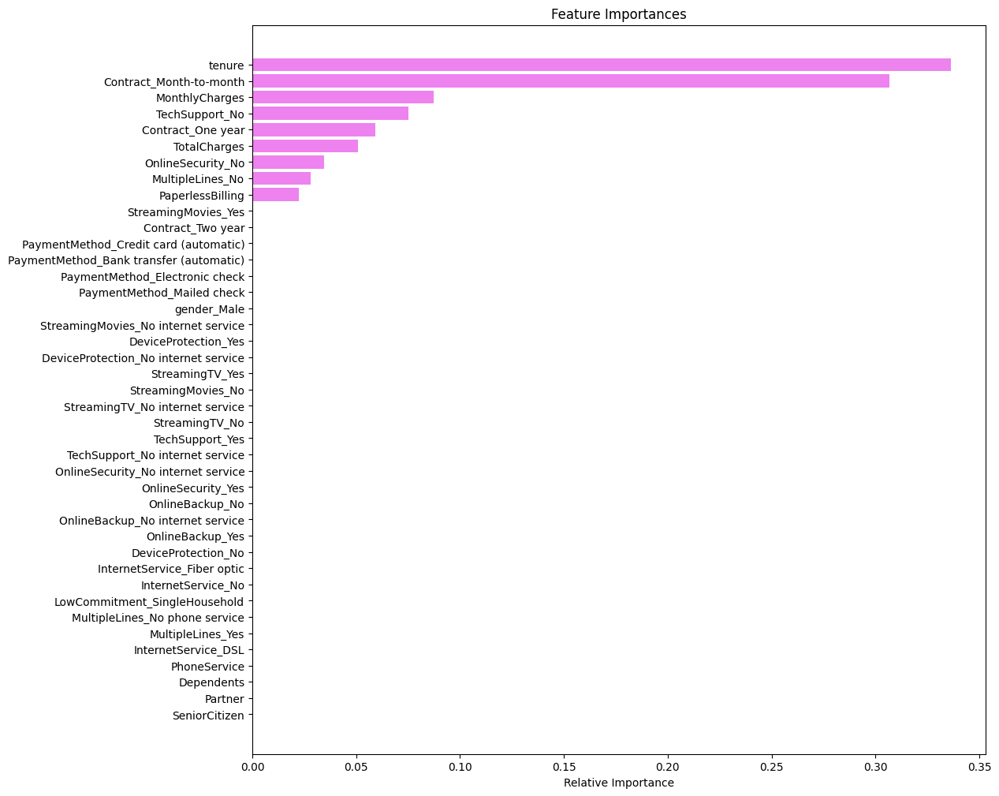

In [ ]:
feature_names = X_test.columns
importances = final_model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

- Tenure lenght of the customer, customer selecting month-to-month contract, and monthly charges incured has been highlighted as the strongest predictor to Churn by my best model.

#Business Insights and Recommendations

#**Executive Summary**

The 26.5% churn rate observed in this dataset is systematic rather than random. Churn is primarily driven by the interaction of contract flexibility, tenure, and price sensitivity, with the highest risk concentrated among single-household customers with low contractual commitment.

The best-performing model (AdaBoost) identified tenure, month-to-month contracts, and monthly charges as the strongest predictors of churn. This aligns with insights from exploratory analysis: single-household customers—typically without partners or dependents—prefer month-to-month contracts, adopt fewer bundled services, and are often highly price-sensitive despite paying relatively higher monthly charges.

This segment churns at nearly twice the rate of family-oriented customers, with churn risk peaking when monthly charges approach or exceed $80, particularly within the 10–18 month tenure window. Their preference for short-term contracts likely reflects income uncertainty and a desire for flexibility, increasing their responsiveness to price changes.

#Core Business Insights
1. **Low commitment strongly increases churn risk**

Month-to-month contracts consistently exhibit higher churn

Short-tenure customers churn significantly more frequently

Contract flexibility amplifies price sensitivity

➡️ Low switching costs accelerate churn


2. **Price pressure disproportionately affects single-household customers**

Single-household, low-commitment customers:

Pay higher average MonthlyCharges

Exhibit sharply higher churn at upper price bands

Show a clear price threshold effect around $80


➡️ These are not low-value customers; they are price-sensitive customers paying premium prices without commitment incentives


3. **Churn peaks when high prices meet low switching barriers**

The highest churn risk occurs when customers have:

Month-to-month contracts

Short tenure

High MonthlyCharges

No partner or dependents

➡️ Churn is driven by misaligned pricing for flexibility-seeking customers


#Strategic Business Recommendations

**1.Targeted Retention for Single-Household, Low-Commitment Customers (Highest Priority)**

Target segment:

Single-household customers

Month-to-month contracts

Tenure below 12–18 months

MonthlyCharges above $80

Actions:

- Offer early contract-conversion incentives (e.g., 6-month plans with modest discounts)

- Deploy price-relief offers when customers cross churn-sensitive price thresholds

- Trigger retention campaigns before renewal or billing cycles

- Retention efforts should focus on perceived value rather than long-term lock-in.

**2. Introduce “Commitment-Light” Pricing Options**

Many single-household customers value flexibility but still require price fairness.

Recommendations:

- Introduce 3-month and 6-month contract options

- Offer price-stabilized month-to-month plans

- Bundle flexibility with light discounts or service credits

🎯 This reduces churn while respecting customers’ need for short-term commitment.


**3. Operationalize Price Sensitivity as an Early-Warning Signal**

MonthlyCharges should be treated as a churn risk indicator, not just a revenue metric.

Implementation:

- Flag customers—especially single-household—when MonthlyCharges exceed churn thresholds

- Proactively intervene with targeted promotions and plan reviews

- Monitor churn risk during the 10–18 month tenure window

**4. Improve Data & Customer Mix Strategy**

- Collect additional demographic indicators (e.g., age range, education level, household size) to refine segmentation and modeling

- Design acquisition campaigns aimed at family-oriented customers, who exhibit lower churn and higher lifetime value